## 第7章 聚类算法与异常值检测

In [1]:
## 输出高清图像
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
## 图像显示中文的问题
import matplotlib
matplotlib.rcParams['axes.unicode_minus']=False

import seaborn as sns 
sns.set(font= "Kaiti",style="ticks",font_scale=1.4)

## 忽略提醒
import warnings
warnings.filterwarnings("ignore")

In [2]:
## 导入会使用到的相关库
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns 

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_wine
from sklearn.cluster import *
from sklearn.metrics.cluster import v_measure_score
from sklearn.metrics import *
from sklearn.mixture import GaussianMixture,BayesianGaussianMixture
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.svm import OneClassSVM

from pyclustering.cluster.kmedians import kmedians
from pyclustering.cluster.fcm import fcm
from pyclustering.cluster import cluster_visualizer

from scipy.cluster import hierarchy

import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout

import pyod.models as pym
from pyod.models.cof import COF
from pyod.models.pca import PCA
from pyod.models.sod import SOD
from pyod.models.iforest import IForest
from pyod.models.xgbod import XGBOD


### 7.2 聚类算法（数据聚类分析）

####  7.2.1 K均值与K中值聚类


In [5]:
## 对酒数据的TSNE降维后的结果进行聚类分析

## 对酒的特征数据进行标准化
wine_x,wine_y = load_wine(return_X_y=True)
wine_x = StandardScaler().fit_transform(wine_x)
print("每类样本数量:",np.unique(wine_y,return_counts = True))

## TSNE进行数据的降维,降维到3维空间中
tsne = TSNE(n_components = 3,perplexity =25,
            early_exaggeration =3,random_state=123) 


## 获取降维后的数据
tsne_wine_x = tsne.fit_transform(wine_x)
print(tsne_wine_x.shape)

每类样本数量: (array([0, 1, 2]), array([59, 71, 48]))
(178, 3)


#### K均值聚类和K中值聚类

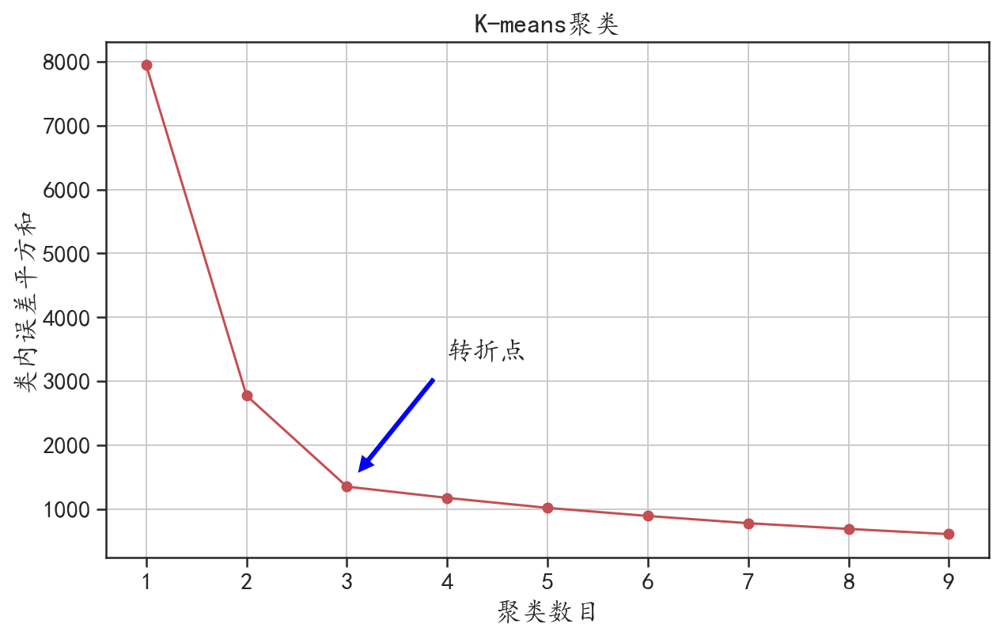

In [6]:
## 使用肘方法搜索合适的聚类数目
kmax = 10
K = np.arange(1,kmax)
iner = [] ## 类内误差平方和
for ii in K:
    kmean = KMeans(n_clusters=ii,random_state=1)
    kmean.fit(tsne_wine_x)
    ## 计算类内误差平方和
    iner.append(kmean.inertia_) 
## 可视化类内误差平方和的变化情况
plt.figure(figsize=(10,6))
plt.plot(K,iner,"r-o")
plt.xlabel("聚类数目")
plt.ylabel("类内误差平方和")
plt.title("K-means聚类")
## 在图中添加一个箭头
plt.annotate("转折点", xy=(3,iner[2]),xytext=(4,iner[2] + 2000),
             arrowprops=dict(facecolor='blue', shrink=0.1))
plt.grid()
plt.show()

In [7]:
## 将数据聚类为3类并可视化相关结果
## 使用KMeans将数据聚类为3类
kmean = KMeans(n_clusters=3,random_state=1)
k_pre = kmean.fit_predict(tsne_wine_x)
print("每簇包含的样本数量:",np.unique(k_pre,return_counts = True))
print("每个簇的聚类中心为:\n",kmean.cluster_centers_)
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,k_pre))

## 该得分是聚类同质性和完整性的调和平均数，越接近于1，说明聚类的效果越好,
# 同质性(Homogeneity): 每个聚类(簇)里面只包含单个类的样本。
# 完备性(completeness): 一个给定类的所有样本都被分到了同一个聚类(簇)中。

每簇包含的样本数量: (array([0, 1, 2], dtype=int32), array([55, 66, 57]))
每个簇的聚类中心为:
 [[ 4.8639865  -2.6453774  -2.828165  ]
 [-6.274162    5.354256    2.4455602 ]
 [-0.36793578  0.8936551   1.3267051 ]]
聚类效果V测度: 0.7728


In [8]:
## 使用Kmedians将数据聚类为3类
initial_centers = tsne_wine_x[[1,51,100],:]
np.random.seed(10)
kmed = kmedians(data=tsne_wine_x,initial_medians = initial_centers)
kmed.process()   # 算法训练数据
kmed_pre = kmed.get_clusters() # 聚类结果
kmed_center = np.array(kmed.get_medians())
## 将聚类结果处理为类别标签
kmed_pre_label = np.arange(len(tsne_wine_x))
for ii,li in enumerate(kmed_pre):
    kmed_pre_label[li] = ii

print("每簇包含的样本数量:",np.unique(kmed_pre_label,return_counts = True))
print("每个簇的聚类中心为:\n",kmed_center)
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,kmed_pre_label))

## 该得分是聚类同质性和完整性的调和平均数，越接近于1，说明聚类的效果越好

每簇包含的样本数量: (array([0, 1, 2]), array([64, 63, 51]))
每个簇的聚类中心为:
 [[-0.50812994  0.41691253  3.0729903 ]
 [-6.3453598   4.53739357  5.49312544]
 [ 5.36085081 -3.59926462 -0.22226299]]
聚类效果V测度: 0.8609


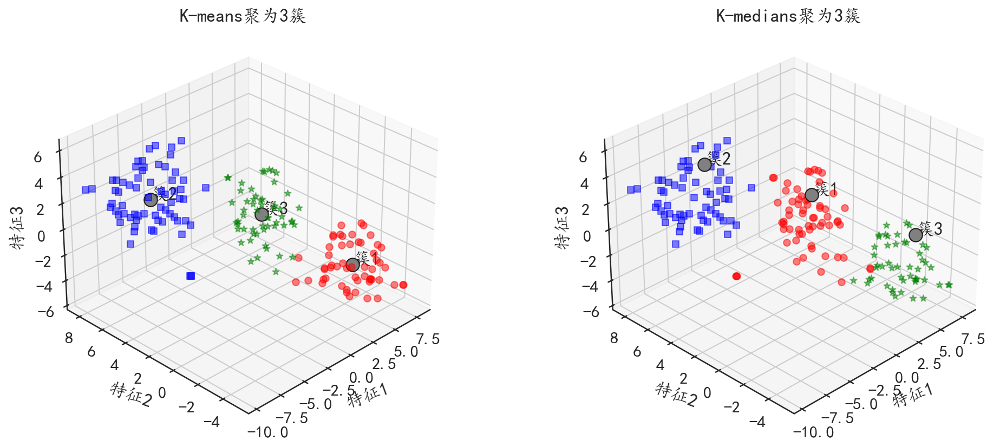

In [9]:
## 在3D空间中可视化聚类后的数据空间分布
colors = ["red","blue","green"]
shapes = ["o","s","*"]
fig = plt.figure(figsize=(15,6))
## 将坐标系设置为3D,K均值聚类结果
ax1 = fig.add_subplot(121, projection="3d")
for ii,y in enumerate(k_pre):
    ax1.scatter(tsne_wine_x[ii,0],tsne_wine_x[ii,1],tsne_wine_x[ii,2],
                s = 40,c = colors[y],marker = shapes[y],alpha = 0.5)
## 可视化聚类中心
for ii in range(len(np.unique(k_pre))):
    x = kmean.cluster_centers_[ii,0]
    y = kmean.cluster_centers_[ii,1]
    z = kmean.cluster_centers_[ii,2]
    ax1.scatter(x,y,z,c = "gray",marker="o",s=150,edgecolor='k')
    ax1.text(x,y,z,"簇"+str(ii+1))
ax1.set_xlabel("特征1",rotation=20)
ax1.set_ylabel("特征2",rotation=-20)
ax1.set_zlabel("特征3",rotation=90)
ax1.azim = 225
ax1.set_title("K-means聚为3簇")

## K中位数聚类结果
ax2 = fig.add_subplot(122, projection="3d")
for ii,y in enumerate(kmed_pre_label):
    ax2.scatter(tsne_wine_x[ii,0],tsne_wine_x[ii,1],tsne_wine_x[ii,2],
                s = 40,c = colors[y],marker = shapes[y],alpha = 0.5)
for ii in range(len(np.unique(kmed_pre_label))):
    x = kmed_center[ii,0]
    y = kmed_center[ii,1]
    z = kmed_center[ii,2]
    ax2.scatter(x,y,z,c = "gray",marker="o",s=150,edgecolor='k')
    ax2.text(x,y,z,"簇"+str(ii+1))
    
ax2.set_xlabel("特征1",rotation=20)
ax2.set_ylabel("特征2",rotation=-20)
ax2.set_zlabel("特征3",rotation=90)
ax2.azim = 225
ax2.set_title("K-medians聚为3簇")
plt.tight_layout()
plt.show()


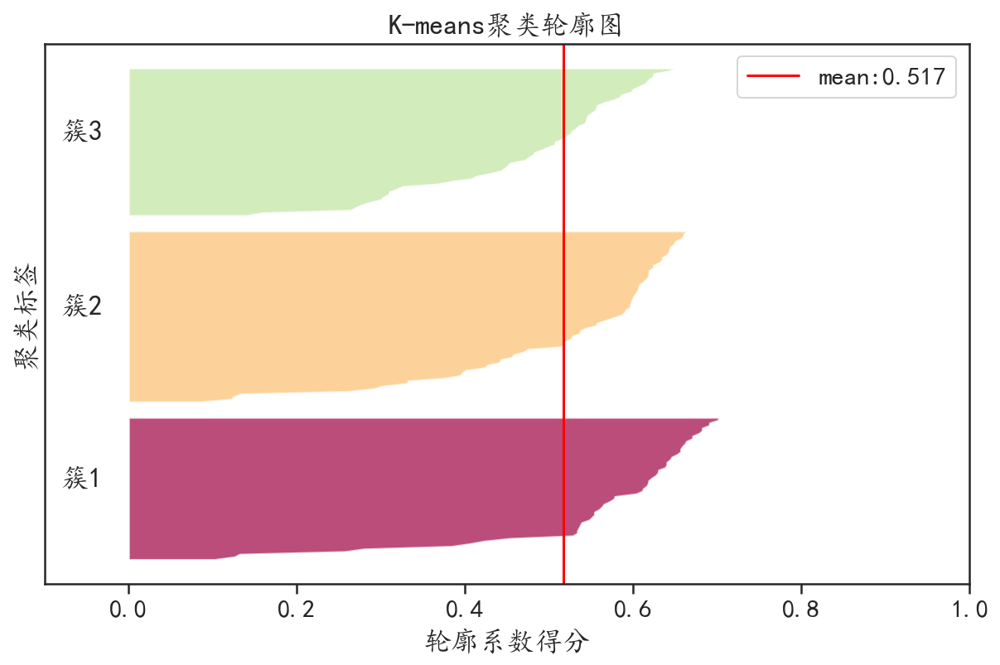

In [8]:
## 使用轮廓系数评价聚类效果的好坏
## 计算整体的平均轮廓系数,K均值
sil_score = silhouette_score(tsne_wine_x,k_pre)
## 计算每个样本的silhouette值，K均值
sil_samp_val = silhouette_samples(tsne_wine_x,k_pre)

## 可视化聚类分析轮廓图，K均值
plt.figure(figsize=(10,6))
y_lower = 10
n_clu = len(np.unique(k_pre))
for ii in np.arange(n_clu):  ## 聚类为了3类
    ## 将第ii类样本的silhouette值放在一块排序
    iiclu_sil_samp_sort = np.sort(sil_samp_val[k_pre == ii])
    ## 计算第ii类的数量
    iisize = len(iiclu_sil_samp_sort)
    y_upper = y_lower + iisize
    ## 设置ii类图像的颜色
    color = plt.cm.Spectral(ii / n_clu)
    plt.fill_betweenx(np.arange(y_lower,y_upper),0,iiclu_sil_samp_sort,
                      facecolor = color,alpha = 0.7)
    # 簇对应的y轴中间添加标签
    plt.text(-0.08,y_lower + 0.5*iisize,"簇"+str(ii+1)) 
    ## 更新 y_lower
    y_lower = y_upper + 5
## 添加平均轮廓系数得分直线
plt.axvline(x=sil_score,color="red",label = "mean:"+str(np.round(sil_score,3)))
plt.xlim([-0.1,1])   
plt.yticks([])
plt.legend(loc = 1)
plt.xlabel("轮廓系数得分")
plt.ylabel("聚类标签")
plt.title("K-means聚类轮廓图")
plt.show()

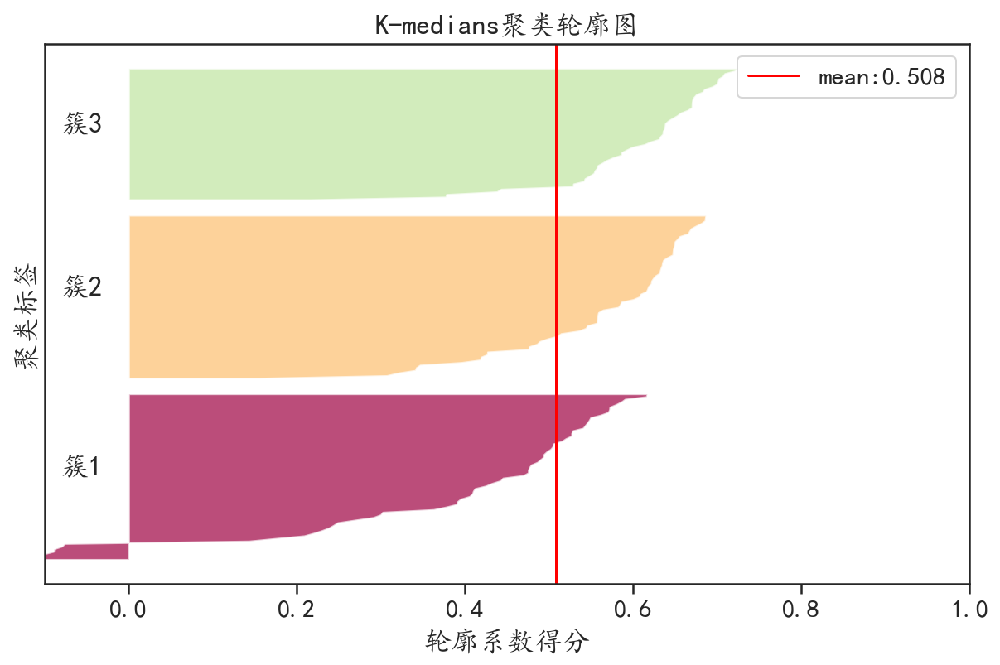

In [9]:
## 使用轮廓系数评价聚类效果的好坏
## 计算整体的平均轮廓系数,K中位数
sil_score = silhouette_score(tsne_wine_x,kmed_pre_label)
## 计算每个样本的silhouette值，K中位数
sil_samp_val = silhouette_samples(tsne_wine_x,kmed_pre_label)

## 可视化聚类分析轮廓图，K中位数
plt.figure(figsize=(10,6))
y_lower = 10
n_clu = len(np.unique(kmed_pre_label))
for ii in np.arange(n_clu):  ## 聚类为了3类
    ## 将第ii类样本的silhouette值放在一块排序
    iiclu_sil_samp_sort = np.sort(sil_samp_val[kmed_pre_label == ii])
    ## 计算第ii类的数量
    iisize = len(iiclu_sil_samp_sort)
    y_upper = y_lower + iisize
    ## 设置ii类图像的颜色
    color = plt.cm.Spectral(ii / n_clu)
    plt.fill_betweenx(np.arange(y_lower,y_upper),0,iiclu_sil_samp_sort,
                      facecolor = color,alpha = 0.7)
    # 簇对应的y轴中间添加标签
    plt.text(-0.08,y_lower + 0.5*iisize,"簇"+str(ii+1)) 
    ## 更新 y_lower
    y_lower = y_upper + 5
## 添加平均轮廓系数得分直线
plt.axvline(x=sil_score,color="red",label = "mean:"+str(np.round(sil_score,3)))
plt.xlim([-0.1,1])   
plt.yticks([])
plt.legend(loc = 1)
plt.xlabel("轮廓系数得分")
plt.ylabel("聚类标签")
plt.title("K-medians聚类轮廓图")
plt.show()

#### 7.2.2 层次聚类


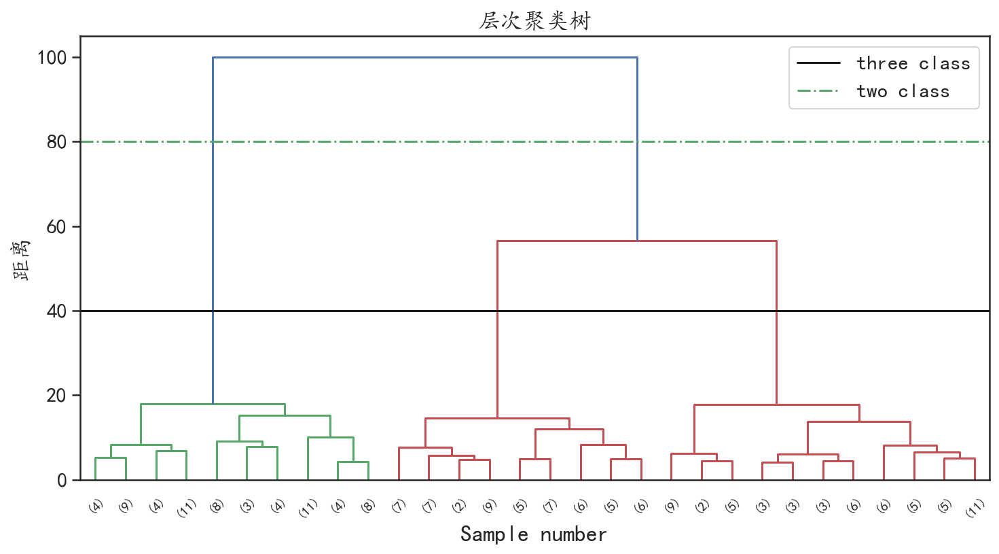

In [10]:
## 层次聚类
## 对数据进行系统聚类并绘制树
Z = hierarchy.linkage(tsne_wine_x, method="ward", metric="euclidean")
fig = plt.figure(figsize=(12,6))
Irisdn = hierarchy.dendrogram(Z,truncate_mode = "lastp")
plt.axhline(y = 40,color="k",linestyle="solid",label="three class")
plt.axhline(y = 80,color="g",linestyle="dashdot",label="two class")
plt.title("层次聚类树")
plt.xlabel("Sample number")
plt.ylabel("距离")
plt.legend(loc = 1)
plt.show()

In [11]:
## 计算系统聚类后每个簇的信息
## 最多聚类为两类
hie2 = hierarchy.fcluster(Z,t = 2, criterion="maxclust")
print("聚为2个簇,每簇包含的样本数量:\n",np.unique(hie2,return_counts = True))
print("聚为2个簇,聚类效果V测度: %.4f"%v_measure_score(wine_y,hie2))
## 最多聚类为三类
hie3 = hierarchy.fcluster(Z,t = 3, criterion="maxclust")
print("聚为3个簇,每簇包含的样本数量:\n",np.unique(hie3,return_counts = True))
print("聚为3个簇,聚类效果V测度: %.4f"%v_measure_score(wine_y,hie3))

聚为2个簇,每簇包含的样本数量:
 (array([1, 2], dtype=int32), array([ 66, 112]))
聚为2个簇,聚类效果V测度: 0.6084
聚为3个簇,每簇包含的样本数量:
 (array([1, 2, 3], dtype=int32), array([66, 54, 58]))
聚为3个簇,聚类效果V测度: 0.7838


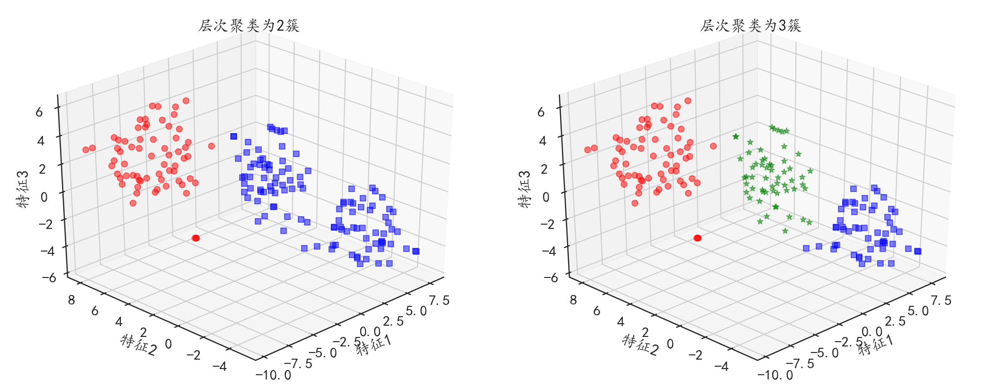

In [12]:
## 将聚类为两类和3类的结果在空间中可视化出来
colors = ["red","blue","green"]
shapes = ["o","s","*"]
fig = plt.figure(figsize=(15,6))
## 将坐标系设置为3D,层次聚类结果
ax1 = fig.add_subplot(121, projection="3d")
for ii,y in enumerate(hie2-1):
    ax1.scatter(tsne_wine_x[ii,0],tsne_wine_x[ii,1],tsne_wine_x[ii,2],
                s = 40,c = colors[y],marker = shapes[y],alpha = 0.5)
ax1.set_xlabel("特征1",rotation=20)
ax1.set_ylabel("特征2",rotation=-20)
ax1.set_zlabel("特征3",rotation=90)
ax1.azim = 225
ax1.set_title("层次聚类为2簇")

ax2 = fig.add_subplot(122, projection="3d")
for ii,y in enumerate(hie3-1):
    ax2.scatter(tsne_wine_x[ii,0],tsne_wine_x[ii,1],tsne_wine_x[ii,2],
                s = 40,c = colors[y],marker = shapes[y],alpha = 0.5)
ax2.set_xlabel("特征1",rotation=20)
ax2.set_ylabel("特征2",rotation=-20)
ax2.set_zlabel("特征3",rotation=90)
ax2.azim = 225
ax2.set_title("层次聚类为3簇")
plt.tight_layout()
plt.show()


#### 7.2.3 谱聚类和模糊聚类

谱聚类是从图论中演化出来的算法，后来在聚类中得到了广泛的应用。它的主要思想是把所有的数据看做空间中的点，这些点之间可以用边连接起来。距离较远的两个点之间的边权重值较低，而距离较近的两个点之间的边权重值较高，通过对所有数据点组成的图进行切图，让切图后不同的子图间边权重和尽可能的低，而子图内的边权重和尽可能的高，从而达到聚类的目的。

模糊C均值（Fuzzy C-means）算法简称FCM算法.每个对象和每个簇赋予一个权值，指明对象属于该簇的程度。


In [13]:
## 使用K近邻算法相似矩阵的建立方式
speclu_nei = SpectralClustering(n_clusters=3,  # 投影到子空间的维度
                                affinity="nearest_neighbors", # 相似矩阵的建立方式
                                n_neighbors = 5,  # 相似矩阵的建立时使用的近邻数
                                random_state = 123)
speclu_nei.fit(tsne_wine_x)
## 计算聚类的效果
nei_pre = speclu_nei.labels_
print("聚为3个簇,每簇包含的样本数量:\n",np.unique(nei_pre,return_counts = True))
print("聚为3个簇,聚类效果V测度: %.4f"%v_measure_score(wine_y,nei_pre))
## 使用rbf算法相似矩阵的建立方式
speclu_rbf = SpectralClustering(n_clusters=3,  # 投影到子空间的维度
                                affinity="rbf", # 相似矩阵的建立方式
                                gamma = 0.005,  # 相似矩阵的建立时使用的参数
                                random_state = 123)
speclu_rbf.fit(tsne_wine_x)
## 计算聚类的效果
rbf_pre = speclu_rbf.labels_
print("聚为3个簇,每簇包含的样本数量:\n",np.unique(rbf_pre,return_counts = True))
print("聚为3个簇,聚类效果V测度: %.4f"%v_measure_score(wine_y,rbf_pre))

聚为3个簇,每簇包含的样本数量:
 (array([0, 1, 2], dtype=int32), array([55, 65, 58]))
聚为3个簇,聚类效果V测度: 0.7844
聚为3个簇,每簇包含的样本数量:
 (array([0, 1, 2], dtype=int32), array([66, 63, 49]))
聚为3个簇,聚类效果V测度: 0.8958


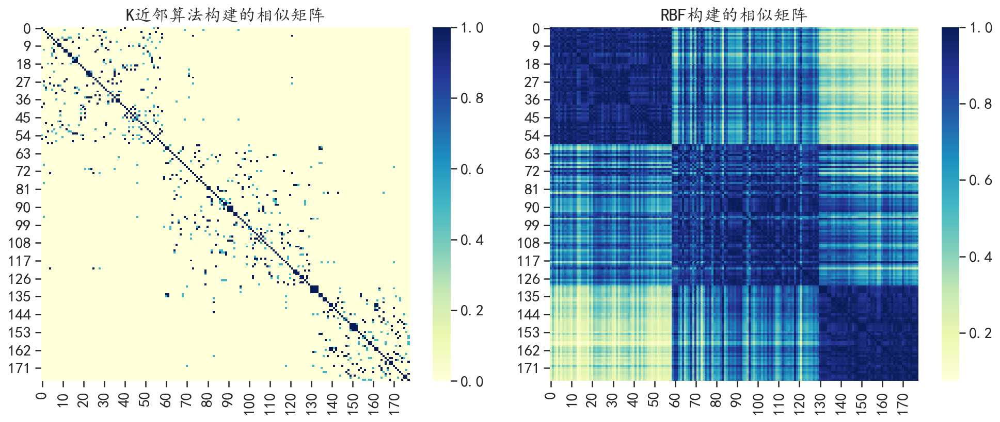

In [14]:
## 可视化中不同的聚类结果构建的相似矩阵
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.heatmap(speclu_nei.affinity_matrix_.toarray(),cmap="YlGnBu")
plt.title("K近邻算法构建的相似矩阵")
plt.subplot(1,2,2)
sns.heatmap(speclu_rbf.affinity_matrix_,cmap="YlGnBu")
plt.title("RBF构建的相似矩阵")
plt.tight_layout()
plt.show()

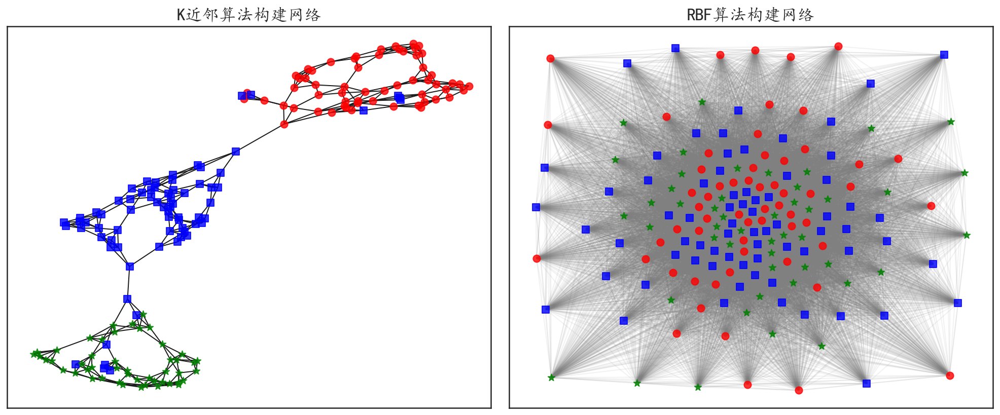

In [15]:
## 在二维空间中可视化两种不同的算法构建的节点网络
colors = ["red","blue","green"]
shapes = ["o","s","*"]
nei_mat = speclu_nei.affinity_matrix_.toarray()
rbf_mat = speclu_rbf.affinity_matrix_

## 可视化网络图
plt.figure(figsize=(14,6))
## 使用K近邻算法获得的网路图
plt.subplot(1,2,1)
G1 = nx.Graph(nei_mat)  ## 生成无项图
pos1=graphviz_layout(G1,prog="fdp")
for ii in range(3):    # 为每种类型的点设置颜色和形状
    nodelist = np.arange(len(wine_y))[wine_y == ii]
    nx.draw_networkx_nodes(G1,pos1,nodelist = nodelist,alpha=0.8,
                           node_size=50,node_color = colors[ii],
                           node_shape=shapes[ii])
nx.draw_networkx_edges(G1,pos1,width=1,edge_color= "k")
plt.title("K近邻算法构建网络")
## 使用RBF算法获得的网路图
plt.subplot(1,2,2)
G2 = nx.Graph(rbf_mat)  ## 生成无项图
pos2=graphviz_layout(G2,prog="fdp")
for ii in range(3):    # 为每种类型的点设置颜色和形状
    nodelist = np.arange(len(wine_y))[wine_y == ii]
    nx.draw_networkx_nodes(G2,pos2,nodelist = nodelist,alpha=0.8,
                           node_size=50,node_color = colors[ii],
                           node_shape=shapes[ii])
nx.draw_networkx_edges(G2,pos2,width=1,alpha = 0.1,edge_color= "gray")
plt.title("RBF算法构建网络")
plt.tight_layout()
plt.show() 

In [16]:
## 模糊聚类
initial_centers = tsne_wine_x[[1,51,100],:]
fcmcluster = fcm(data = tsne_wine_x,initial_centers=initial_centers)
fcmcluster.process()   # 算法训练数据
fcmcluster_pre = fcmcluster.get_clusters() # 聚类结果
## 将聚类结果处理为类别标签
fcmcluster_label = np.arange(len(tsne_wine_x))
for ii,li in enumerate(fcmcluster_pre):
    fcmcluster_label[li] = ii
## 获取每个样本预测的隶属度
membership = fcmcluster.get_membership()
membership = np.array(membership)
print("每簇包含的样本数量:",np.unique(fcmcluster_label,return_counts = True))
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,fcmcluster_label))
print("前几个样本属于每个类的隶属度:\n",np.round(membership[0:4,:],4))


每簇包含的样本数量: (array([0, 1, 2]), array([57, 66, 55]))
聚类效果V测度: 0.7728
前几个样本属于每个类的隶属度:
 [[1.050e-02 9.883e-01 1.200e-03]
 [5.500e-02 9.425e-01 2.600e-03]
 [2.700e-03 9.971e-01 2.000e-04]
 [1.070e-02 9.880e-01 1.300e-03]]


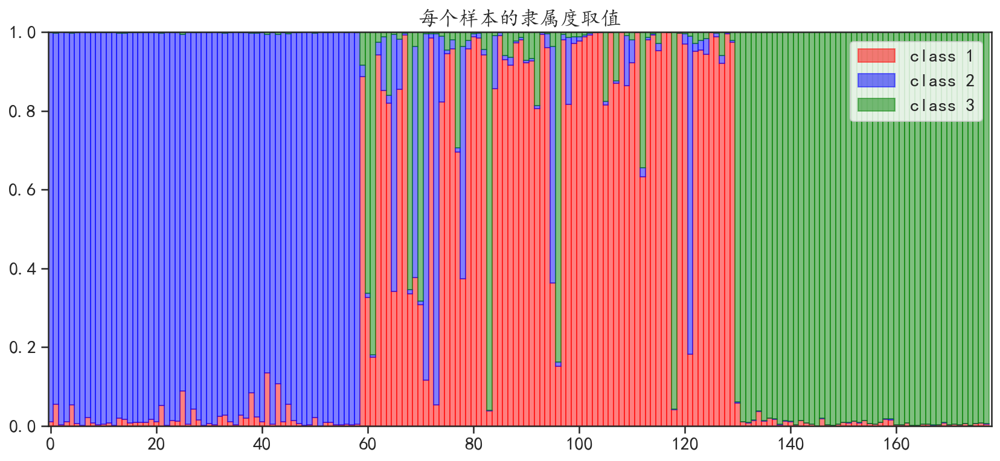

In [17]:
## 使用堆积直方图可视化每个样本的隶属度
plt.figure(figsize=(14,6))
x = np.arange(membership.shape[0])
plt.bar(x, membership[:,0], color="red", edgecolor='red', width=1,
        label = "class 1",alpha = 0.5)
plt.bar(x, membership[:,1],bottom = membership[:,0], color="blue", 
        edgecolor='blue', width=1,label = "class 2",alpha = 0.5)
plt.bar(x, membership[:,2], bottom = membership[:,0] + membership[:,1],
        color="green", edgecolor='green', width=1,label = "class 3",alpha = 0.5)
plt.xlim([-0.5,len(x)])
plt.title("每个样本的隶属度取值")
plt.legend()
plt.show()

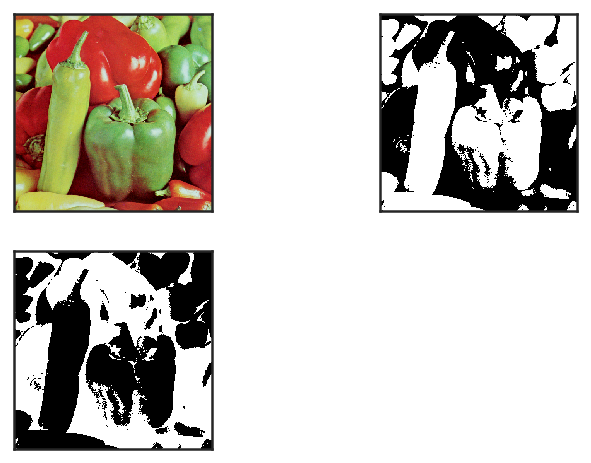

In [18]:
## 使用模糊聚类进行图像分割
from pyclustering.utils import read_image, draw_image_mask_segments
imdata = read_image("data/chap7/辣椒.tiff")
## 初始化使用的聚类中心
fcm_imseg = fcm(imdata, initial_centers = [[210,51,39],[210,234,229]])
fcm_imseg.process()
imseg_clusters = fcm_imseg.get_clusters()
# 可视化图像的分割结果
draw_image_mask_segments("data/chap7/辣椒.tiff", imseg_clusters)

#### 7.2.4 基于密度的算法-DBSCAN


         X1        X2  Y
0  0.742420  0.585567  0
1  1.744439  0.039096  1
2  1.693479 -0.190619  1
3  0.739570  0.639275  0
4 -0.378025  0.974814  0


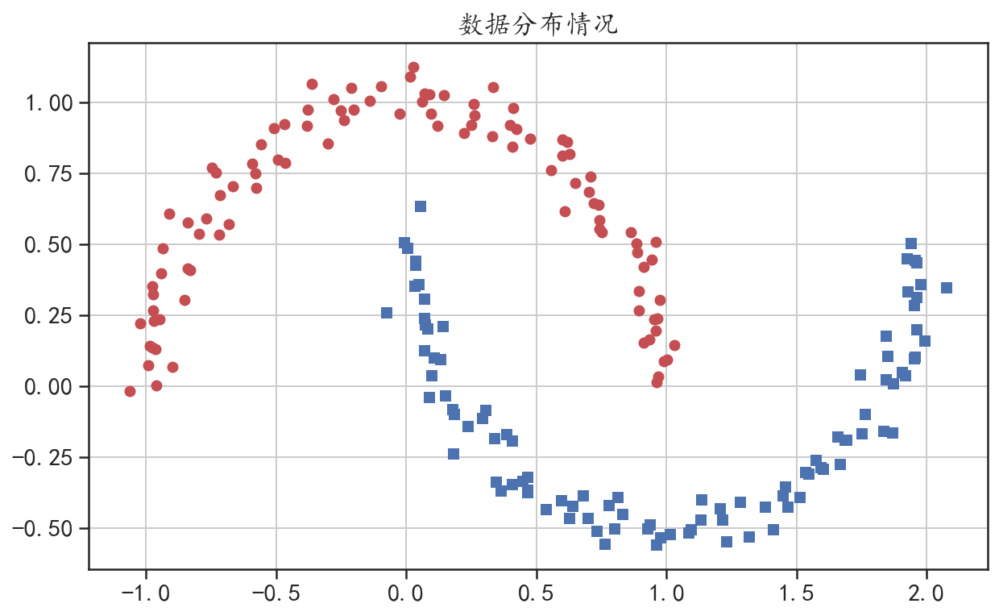

In [19]:
## 密度聚类，使用双月数据集进行演示
moons = pd.read_csv("data/chap7/moonsdatas.csv")
print(moons.head())
## 可视化数据的分布情况
index0 = np.where(moons.Y == 0)[0]
index1 = np.where(moons.Y == 1)[0]
plt.figure(figsize=(10,6))
plt.plot(moons.X1[index0],moons.X2[index0],"ro")
plt.plot(moons.X1[index1],moons.X2[index1],"bs")
plt.grid()
plt.title("数据分布情况")
plt.show()

参数eps取值为: 0.2 参数min_samples取值为: 5
每簇包含的样本数量: (array([0, 1]), array([100, 100]))
聚类效果V测度: 1.0000
参数eps取值为: 0.2 参数min_samples取值为: 10
每簇包含的样本数量: (array([-1,  0,  1]), array([  1, 100,  99]))
聚类效果V测度: 0.9802
参数eps取值为: 0.13 参数min_samples取值为: 5
每簇包含的样本数量: (array([-1,  0,  1,  2,  3]), array([  2, 100,  52,  26,  20]))
聚类效果V测度: 0.7177
参数eps取值为: 1 参数min_samples取值为: 10
每簇包含的样本数量: (array([0]), array([200]))
聚类效果V测度: 0.0000


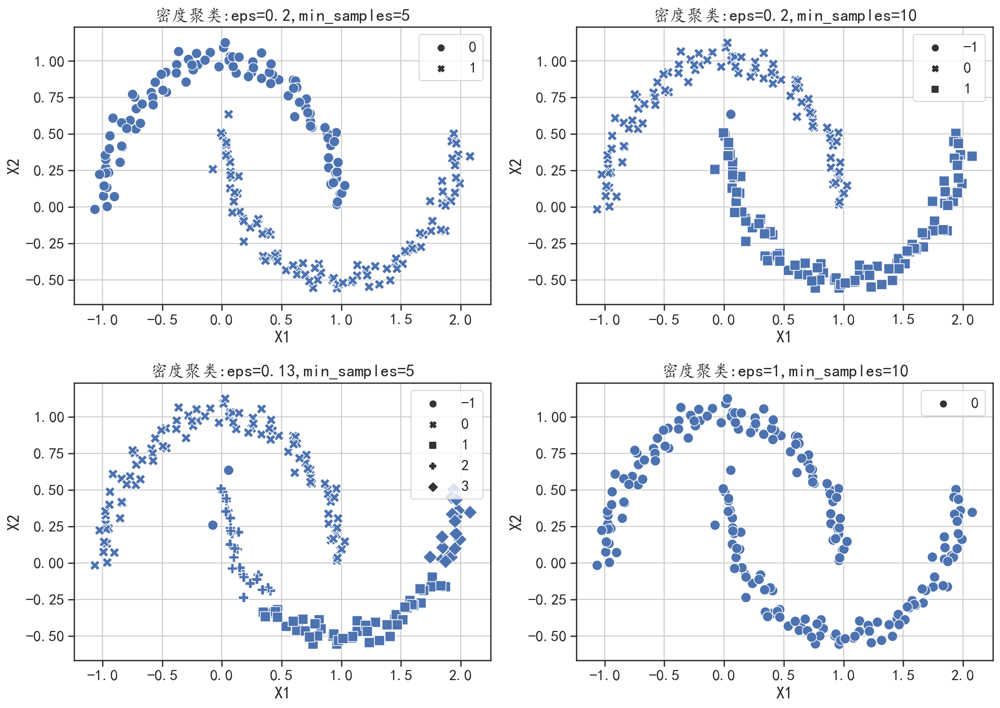

In [20]:
## 对数据进行密度聚类，并可视化出聚类后的结果
epsdata = [0.2,0.2,0.13,1]  ## 定义不同的eps参数的取值
min_sample = [5,10,5,10]    ## 定义不同的min_samples参数的取值
plt.figure(figsize=(14,10))
for ii,eps in enumerate(epsdata):
    db = DBSCAN(eps=eps,min_samples = min_sample[ii])
    db.fit(moons[["X1","X2"]].values)
    ## 获取聚类后的类别标签
    db_pre_lab = db.labels_
    print("参数eps取值为:",eps,"参数min_samples取值为:",min_sample[ii])
    print("每簇包含的样本数量:",np.unique(db_pre_lab,return_counts = True))
    print("聚类效果V测度: %.4f"%v_measure_score(moons["Y"],db_pre_lab))
    print("============================")
    ## 可视化出聚类后的结果
    plt.subplot(2,2,ii+1)
    sns.scatterplot(x=moons["X1"], y=moons["X2"],
                    style = db_pre_lab,s = 100)
    plt.legend(loc = 1)
    plt.grid()
    plt.title("密度聚类:eps="+str(eps)+",min_samples="+str(min_sample[ii]))
plt.tight_layout()
plt.show()

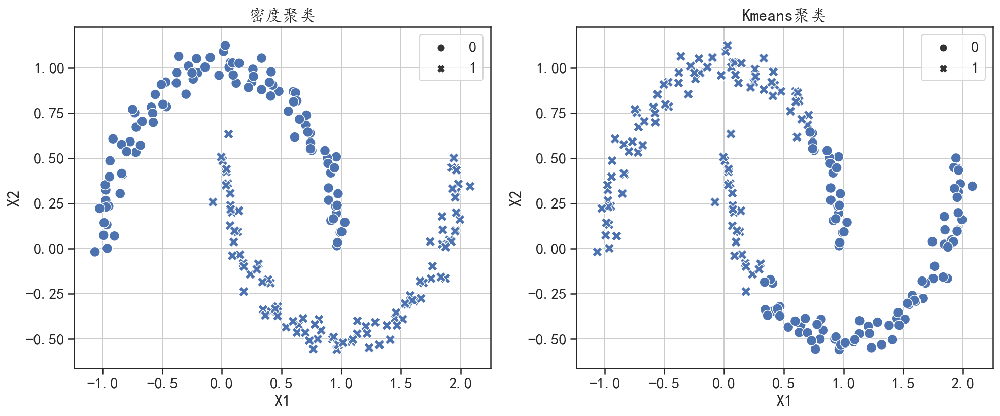

In [21]:
## 将密度聚类和Kmeans聚类的结果进行对比
## 密度聚类
db = DBSCAN(eps=0.2,min_samples = 5)
db.fit(moons[["X1","X2"]].values)
db_pre_lab = db.labels_
## k均值聚类
km = KMeans(n_clusters=2,random_state=1)
k_pre = km.fit_predict(moons[["X1","X2"]].values)
## 可视化两种算法的聚类效果
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.scatterplot(x=moons["X1"], y=moons["X2"],
                style = db_pre_lab,s = 100)
plt.legend(loc = 1)
plt.grid()
plt.title("密度聚类")
plt.subplot(1,2,2)
sns.scatterplot(x=moons["X1"], y=moons["X2"],
                style = k_pre,s = 100)
plt.legend(loc = 1)
plt.grid()
plt.title("Kmeans聚类")
plt.tight_layout()
plt.show()



####  7.2.5 高斯混合模型聚类


In [22]:
## 使用高斯混合模型对酒数据进聚类分析
gmm = GaussianMixture(n_components=3,covariance_type = "full",
                      random_state = 1)
gmm.fit(tsne_wine_x)
## 获取对数据的聚类标签
gmm_pre = gmm.predict(tsne_wine_x)
print("高斯混合模型,每簇包含的样本数量:",np.unique(gmm_pre,return_counts = True))
print("每个簇的聚类中心为:\n",gmm.means_)
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,gmm_pre))

## 使用变分贝叶斯高斯混合模型对酒数据进聚类分析
bgmm = BayesianGaussianMixture(n_components=3,covariance_type = "full",
                               random_state = 1)
bgmm.fit(tsne_wine_x)
## 获取对数据的聚类标签
bgmm_pre = bgmm.predict(tsne_wine_x)
print("变分贝叶斯高斯混合模型,每簇包含的样本数量:",np.unique(bgmm_pre,return_counts = True))
print("每个簇的聚类中心为:\n",bgmm.means_)
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,bgmm_pre))


高斯混合模型,每簇包含的样本数量: (array([0, 1, 2]), array([55, 66, 57]))
每个簇的聚类中心为:
 [[ 4.84977731 -2.63793829 -2.81198864]
 [-6.2588341   5.34343062  2.44775938]
 [-0.36481966  0.89253648  1.31541624]]
聚类效果V测度: 0.7728
变分贝叶斯高斯混合模型,每簇包含的样本数量: (array([0, 1, 2]), array([56, 66, 56]))
每个簇的聚类中心为:
 [[ 4.65006538 -2.49005997 -2.69596208]
 [-6.15419162  5.26613082  2.41588723]
 [-0.41473845  0.91926835  1.35032215]]
聚类效果V测度: 0.7624


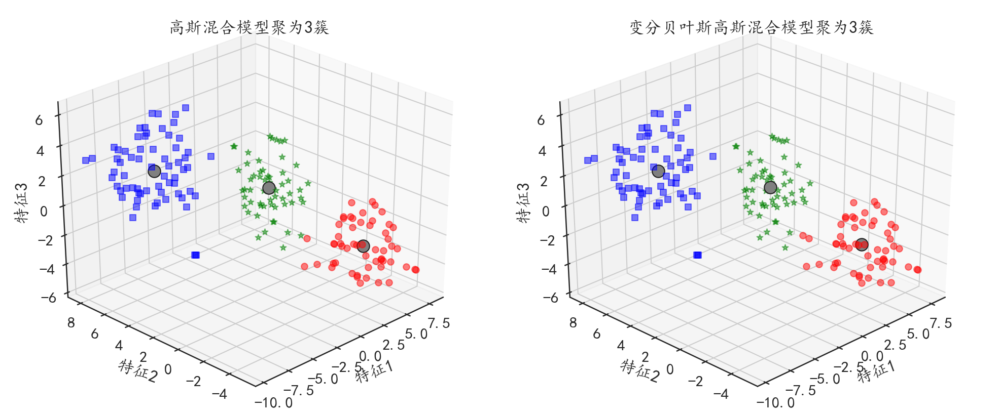

In [23]:
## 可视化算法聚类结果
colors = ["red","blue","green"]
shapes = ["o","s","*"]
fig = plt.figure(figsize=(14,6))
## 将坐标系设置为3D,高斯混合模型聚类结果
ax1 = fig.add_subplot(121, projection="3d")
for ii,y in enumerate(gmm_pre):
    ax1.scatter(tsne_wine_x[ii,0],tsne_wine_x[ii,1],tsne_wine_x[ii,2],
                s = 40,c = colors[y],marker = shapes[y],alpha = 0.5)
## 可视化聚类中心
for ii in range(len(np.unique(gmm_pre))):
    x = gmm.means_[ii,0]
    y = gmm.means_[ii,1]
    z = gmm.means_[ii,2]
    ax1.scatter(x,y,z,c = "gray",marker="o",s=150,edgecolor='k')
#     ax1.text(x,y,z,"簇"+str(ii+1))
ax1.set_xlabel("特征1",rotation=20)
ax1.set_ylabel("特征2",rotation=-20)
ax1.set_zlabel("特征3",rotation=90)
ax1.azim = 225
ax1.set_title("高斯混合模型聚为3簇")
## 变分贝叶斯高斯混合模型聚类结果
ax2 = fig.add_subplot(122, projection="3d")
for ii,y in enumerate(bgmm_pre):
    ax2.scatter(tsne_wine_x[ii,0],tsne_wine_x[ii,1],tsne_wine_x[ii,2],
                s = 40,c = colors[y],marker = shapes[y],alpha = 0.5)
## 可视化聚类中心
for ii in range(len(np.unique(bgmm_pre))):
    x = bgmm.means_[ii,0]
    y = bgmm.means_[ii,1]
    z = bgmm.means_[ii,2]
    ax2.scatter(x,y,z,c = "gray",marker="o",s=150,edgecolor='k')
#     ax2.text(x,y,z,"簇"+str(ii+1))
ax2.set_xlabel("特征1",rotation=20)
ax2.set_ylabel("特征2",rotation=-20)
ax2.set_zlabel("特征3",rotation=90)
ax2.azim = 225
ax2.set_title("变分贝叶斯高斯混合模型聚为3簇")
plt.tight_layout()
plt.show()

#### 7.2.5 亲和力传播聚类


In [24]:
## 对酒数据进行亲和力传播聚类
# preference = -200时
af1 = AffinityPropagation(damping = 0.6, ## 阻尼因子
                         preference = -200, ## 使用的示例样本数量
                         )
af1.fit(tsne_wine_x)
## 输出聚类分析的结果
af1.labels_
print("亲和力传播聚类1:\n每簇包含的样本数量:",np.unique(af1.labels_,return_counts = True))
print("每个簇的聚类中心为:\n",af1.cluster_centers_)
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,af1.labels_))
# preference = -300时
af2 = AffinityPropagation(damping = 0.6, ## 阻尼因子
                         preference = -300, ## 使用的示例样本数量
                         )
af2.fit(tsne_wine_x)
## 输出聚类分析的结果
af2.labels_
print("亲和力传播聚类2:\n每簇包含的样本数量:",np.unique(af2.labels_,return_counts = True))
print("每个簇的聚类中心为:\n",af2.cluster_centers_)
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,af2.labels_))

亲和力传播聚类1:
每簇包含的样本数量: (array([0, 1, 2, 3, 4]), array([20, 45, 27, 37, 49]))
每个簇的聚类中心为:
 [[-6.13429     5.4438906   0.03349963]
 [-6.6762805   5.193717    2.846032  ]
 [ 1.7402011   0.68320787 -0.16615717]
 [-1.64581     0.26387346  2.4150665 ]
 [ 5.983463   -2.8015192  -3.3218582 ]]
聚类效果V测度: 0.7172
亲和力传播聚类2:
每簇包含的样本数量: (array([0, 1, 2]), array([66, 56, 56]))
每个簇的聚类中心为:
 [[-6.6762805   5.193717    2.846032  ]
 [-0.5640356   0.22405082  1.4364102 ]
 [ 4.275578   -2.2846434  -2.6362162 ]]
聚类效果V测度: 0.7624


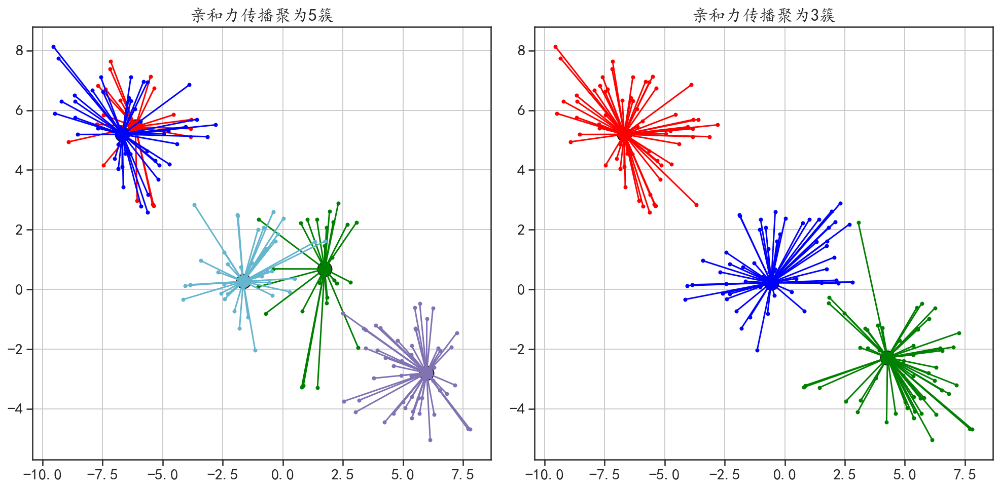

In [25]:
## 使用数据的前两个特征，在二维空间中可视化模型的聚类效果
colors = ["red","blue","green","c","m"]
X = tsne_wine_x[:,0]
Y = tsne_wine_x[:,1]
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
n_clusters = len(af1.cluster_centers_indices_) # 聚类数目
af_label = af1.labels_         # 每个样本的聚类标签
af_centers = af1.cluster_centers_  # 每个簇的聚类中心
for ii in range(n_clusters):
    index = np.where(af_label == ii)
    plt.plot(X[index],Y[index],".",c = colors[ii])
    ## 添加聚类中心的点
    plt.plot(af_centers[ii][0],af_centers[ii][1],"o",c = colors[ii],
             markersize=14,markeredgecolor="k")
    ## 添加样本到聚类中心的连线
    for xx,yy in zip(X[index],Y[index]):
        plt.plot([af_centers[ii][0],xx],[af_centers[ii][1],yy],
                 "-",c = colors[ii])
plt.grid()
plt.title("亲和力传播聚为5簇")
plt.subplot(1,2,2)
n_clusters = len(af2.cluster_centers_indices_) # 聚类数目
af_label = af2.labels_         # 每个样本的聚类标签
af_centers = af2.cluster_centers_  # 每个簇的聚类中心
for ii in range(n_clusters):
    index = np.where(af_label == ii)
    plt.plot(X[index],Y[index],".",c = colors[ii])
    ## 添加聚类中心的点
    plt.plot(af_centers[ii][0],af_centers[ii][1],"o",c = colors[ii],
             markersize=14,markeredgecolor="k")
    ## 添加样本到聚类中心的连线
    for xx,yy in zip(X[index],Y[index]):
        plt.plot([af_centers[ii][0],xx],[af_centers[ii][1],yy],
                 "-",c = colors[ii])
plt.grid()
plt.title("亲和力传播聚为3簇")
plt.tight_layout()
plt.show()
    

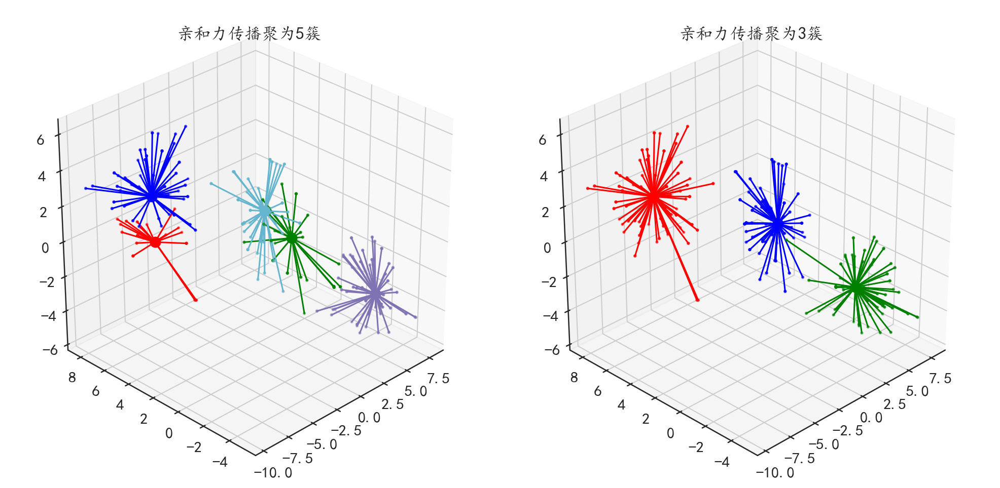

In [26]:
## 在三维空间中可视化模型的聚类效果
colors = ["red","blue","green","c","m"]
X = tsne_wine_x[:,0]
Y = tsne_wine_x[:,1]
Z = tsne_wine_x[:,2]
fig = plt.figure(figsize=(14,7))
ax = fig.add_subplot(121, projection="3d")
n_clusters = len(af1.cluster_centers_indices_) # 聚类数目
af_label = af1.labels_         # 每个样本的聚类标签
af_centers = af1.cluster_centers_  # 每个簇的聚类中心
for ii in range(n_clusters):
    index = np.where(af_label == ii)
    ax.scatter(X[index],Y[index],Z[index],marker=".",c = colors[ii])
    ## 添加聚类中心的点
    ax.scatter(af_centers[ii][0],af_centers[ii][1],af_centers[ii][2],
               marker="o",c = colors[ii],s=100)
    ## 添加样本到聚类中心的连线
    for xx,yy,zz in zip(X[index],Y[index],Z[index]):
        ax.plot3D([af_centers[ii][0],xx],[af_centers[ii][1],yy],
                  [af_centers[ii][2],zz],"-",c = colors[ii])
plt.title("亲和力传播聚为5簇")
ax.azim = 225

ax = fig.add_subplot(122, projection="3d")
n_clusters = len(af2.cluster_centers_indices_) # 聚类数目
af_label = af2.labels_         # 每个样本的聚类标签
af_centers = af2.cluster_centers_  # 每个簇的聚类中心
for ii in range(n_clusters):
    index = np.where(af_label == ii)
    ax.scatter(X[index],Y[index],Z[index],marker=".",c = colors[ii])
    ## 添加聚类中心的点
    ax.scatter(af_centers[ii][0],af_centers[ii][1],af_centers[ii][2],
               marker="o",c = colors[ii],s=100)
    ## 添加样本到聚类中心的连线
    for xx,yy,zz in zip(X[index],Y[index],Z[index]):
        ax.plot3D([af_centers[ii][0],xx],[af_centers[ii][1],yy],
                  [af_centers[ii][2],zz],"-",c = colors[ii])
plt.title("亲和力传播聚为3簇")
ax.azim = 225
plt.tight_layout()
plt.show()
    

#### 7.2.7 BIRCH聚类算法

BIRCH的全称是利用层次方法的平衡迭代规约和聚类（Balanced Iterative Reducing and Clustering Using Hierarchies）


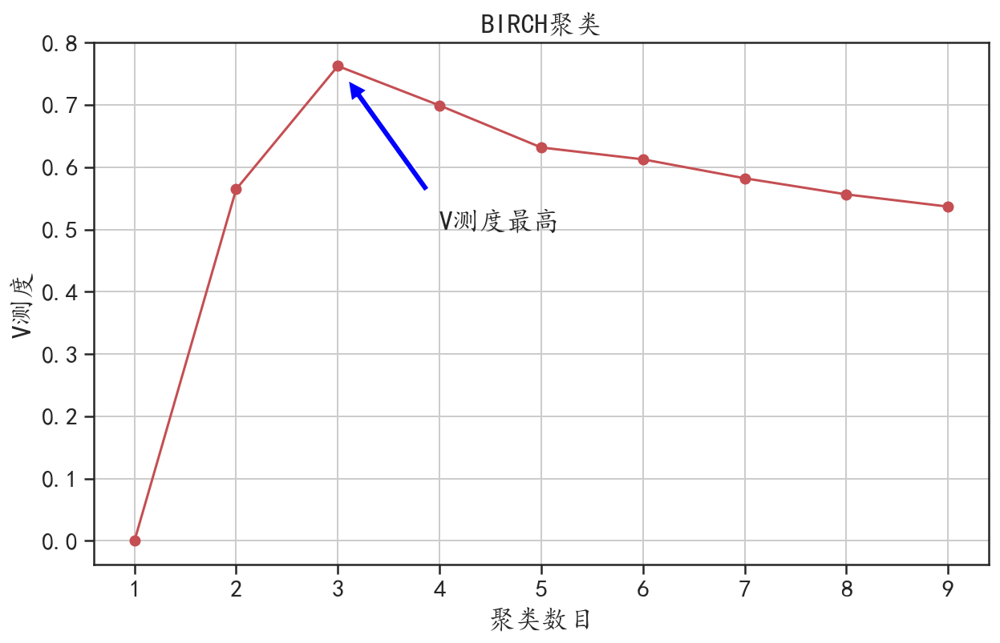

In [27]:
## 计算聚为不同簇的V测度大小
vm = []
n_cluster = 10
for cluster in range(1,n_cluster):
    birch = Birch(threshold = 0.5,       ## 合并样本的半径阈值
                  branching_factor = 20, ## 每个节点中CF子集群的最大数量
                  n_clusters=cluster)
    birch.fit(tsne_wine_x)  # 拟合模型
    vm.append(v_measure_score(wine_y,birch.labels_))
## 可视化V测度的变化情况
plt.figure(figsize=(10,6))
plt.plot(range(1,n_cluster),vm,"r-o")
plt.xlabel("聚类数目")
plt.ylabel("V测度")
plt.title("BIRCH聚类")
## 在图中添加一个箭头
plt.annotate("V测度最高", xy=(3,vm[2]),xytext=(4,0.5),
             arrowprops=dict(facecolor='blue', shrink=0.1))
plt.grid()
plt.show()

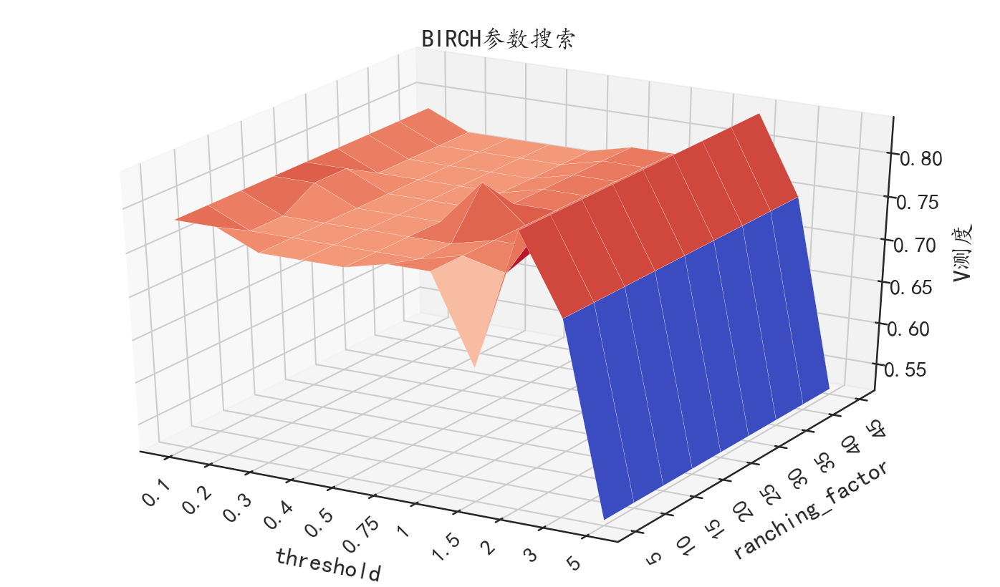

In [28]:
## 使用参数网格搜索的方法寻找最合适的threshold 和 ranching_factor参数
thre = [0.1,0.2,0.3,0.4,0.5, 0.75, 1,1.5,2,3,5]
ranch = np.arange(5,50,5)
threx, ranchy = np.meshgrid(thre,ranch)
vm = np.ones_like(threx)
## 计算不同参数组合下的V测度
for i,t in enumerate(thre):
    for j,r in enumerate(ranch):
        birch = Birch(threshold = t,branching_factor = r,
                      n_clusters=3)
        birch.fit(tsne_wine_x)  # 拟合模型
        vm[j,i] = (v_measure_score(wine_y,birch.labels_))


## 使用3D曲面图可视化交叉验证的平均均方根误差
## 数据准备
x, y = np.meshgrid(range(len(thre)),range(len(ranch)))
## 可视化
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(111, projection="3d")
surf = ax1.plot_surface(x,y,vm,cmap=plt.cm.coolwarm,
                        linewidth=0.1)
plt.xticks(range(len(thre)),thre,rotation=45)
plt.yticks(range(len(ranch)),ranch,rotation=125)
ax1.set_xlabel("threshold",labelpad=25)
ax1.set_ylabel("ranching_factor",labelpad=15)
ax1.set_zlabel("V测度",rotation = 90,labelpad=10)
plt.title("BIRCH参数搜索")
plt.tight_layout()
plt.show()

## 可以发现，当threshold=2时，聚类效果较好

BIRCH聚类,每簇包含的样本数量: (array([0, 1, 2]), array([65, 62, 51]))
聚类效果V测度: 0.8347


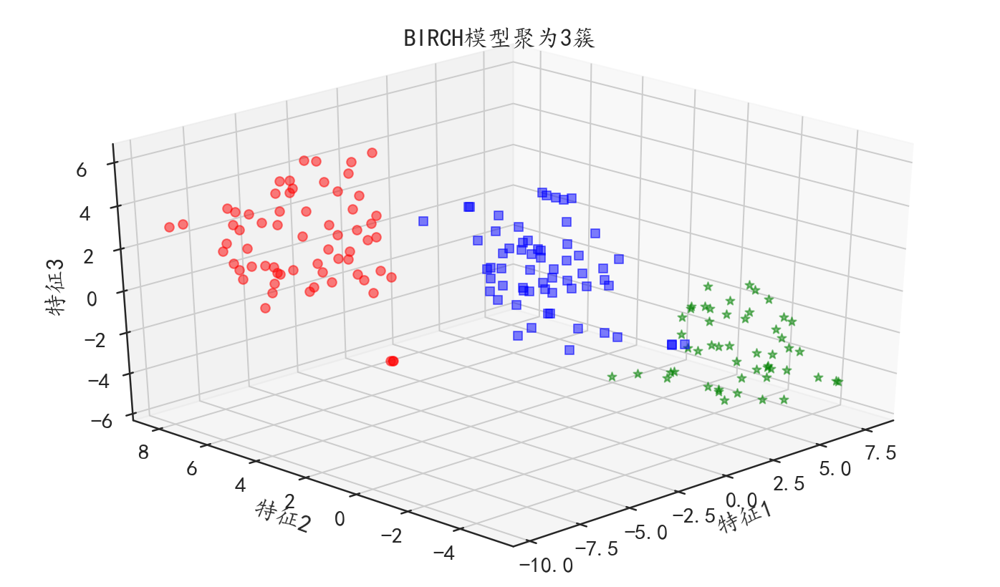

In [29]:
## 使用合适的参数聚类为3类
birch = Birch(threshold = 2,       ## 合并样本的半径阈值
              branching_factor = 20, ## 每个节点中CF子集群的最大数量
              n_clusters=3)
birch.fit(tsne_wine_x)  # 拟合模型
print("BIRCH聚类,每簇包含的样本数量:",np.unique(birch.labels_,return_counts = True))
print("聚类效果V测度: %.4f"%v_measure_score(wine_y,birch.labels_))

## 在3维空间中可视化聚类的效果
colors = ["red","blue","green"]
shapes = ["o","s","*"]
birch_pre = birch.labels_
fig = plt.figure(figsize=(10,6))
## 将坐标系设置为3D,Birch模型聚类结果
ax1 = fig.add_subplot(111, projection="3d")
for ii,y in enumerate(birch_pre):
    ax1.scatter(tsne_wine_x[ii,0],tsne_wine_x[ii,1],tsne_wine_x[ii,2],
                s = 40,c = colors[y],marker = shapes[y],alpha = 0.5)
ax1.set_xlabel("特征1",rotation=20)
ax1.set_ylabel("特征2",rotation=-20)
ax1.set_zlabel("特征3",rotation=90)
ax1.azim = 225
ax1.set_title("BIRCH模型聚为3簇")
plt.tight_layout()
plt.show()

### 7.3 异常值检测算法（数据异常值检测分析）

在机器学习中，在一般的预测问题中，模型通常是对整体样本数据结构的一种表达方式，这种表达方式通常抓住的是整体样本一般性的性质，而那些在这些性质上表现完全与整体样本不一致的点，我们就称其为异常，异常值检测就是发现数据中遮掩性质的一类算法。通过一些检测方法可以找到异常值，但是所得结果并不是绝对正确的，具体情况还需自己根据业务的理解加以判断。同样，对于异常值如何处理，一般情况下是进行删除或者修正，要结合具体的情况没有固定的方式。针对一些类别很不平衡的二分类数据，也可以将较少的类别数据使用异常值的方法进行建模分析。



####  7.3.1 LOF和COF算法
  

In [3]:
## 分析鸢尾花数据
iris = pd.read_csv("data/chap7/Iris.csv")
## 只分析其中的SepalWidthCm和PetalWidthCm两个变量
iris = iris[["SepalWidthCm","PetalWidthCm"]]
print(iris.head())

   SepalWidthCm  PetalWidthCm
0           3.5           0.2
1           3.0           0.2
2           3.2           0.2
3           3.1           0.2
4           3.6           0.2


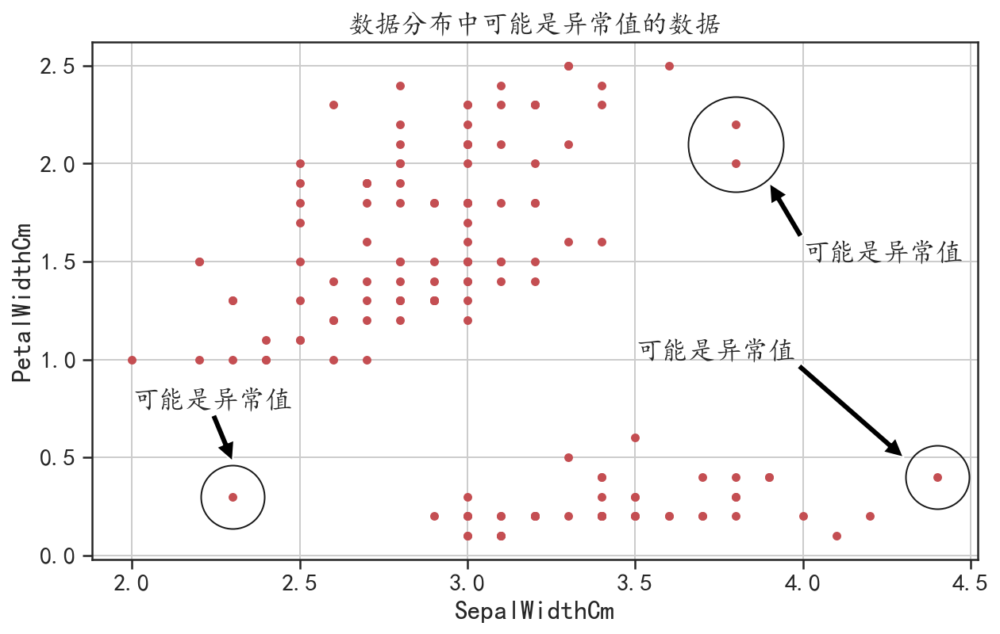

In [4]:
## 可视化SepalWidthCm和PetalWidthCm两个变量
iris.plot(kind = "scatter",x= "SepalWidthCm",y = "PetalWidthCm",
          c = "r",figsize = (10,6))
## 圈出可能是异常值的点
plt.plot(2.3,0.3,"ko",markersize = 40,markerfacecolor = "none")
plt.annotate("可能是异常值", xy=(2.3,0.48),xytext=(2,0.75),
             arrowprops=dict(facecolor="black"))

plt.plot(3.8,2.1,"ko",markersize = 60,markerfacecolor = "none")
plt.annotate("可能是异常值", xy=(3.9,1.9),xytext=(4,1.5),
             arrowprops=dict(facecolor="black"))

plt.plot(4.4,0.4,"ko",markersize = 40,markerfacecolor = "none")
plt.annotate("可能是异常值", xy=(4.3,0.5),xytext=(3.5,1),
             arrowprops=dict(facecolor="black"))
plt.title("数据分布中可能是异常值的数据")
plt.grid()
plt.show()

####  针对该二维空间中的数据，检测哪些样本为异常值，LOF算法


In [32]:
## 局部离群值因子
lof = LocalOutlierFactor(n_neighbors = 10, ## 使用的近邻数量
                         metric = "minkowski",## 使用的计算距离方法
                        )
## 将lof作用数据集
outlier_pre = lof.fit_predict(iris.values)
print("检测出的异常值数量为:",np.sum(outlier_pre == -1))

检测出的异常值数量为: 10


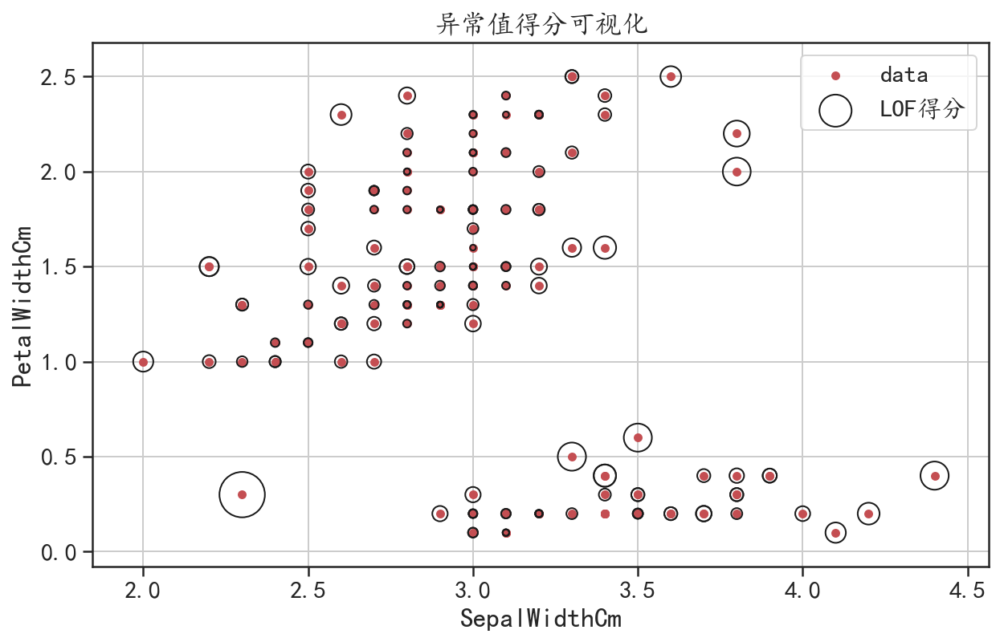

In [33]:
## 可视化每个样本点的异常值得分
## 计算每个样本相反的异常值得分,越接近-1,LOF得分越高
outfactor = lof.negative_outlier_factor_
## 将得分标准化
radius = (outfactor.max() - outfactor) / (outfactor.max() - outfactor.min())
iris.plot(kind = "scatter",x= "SepalWidthCm",y = "PetalWidthCm",
          c = "r",figsize = (10,6),label = "data")
plt.scatter(iris["SepalWidthCm"], iris["PetalWidthCm"], s =800 * radius, 
            edgecolors="k",facecolors="none", label="LOF得分")
plt.legend()
plt.grid()
plt.title("异常值得分可视化")
plt.show()

## 在图像中圆圈越大，越可能为异常值

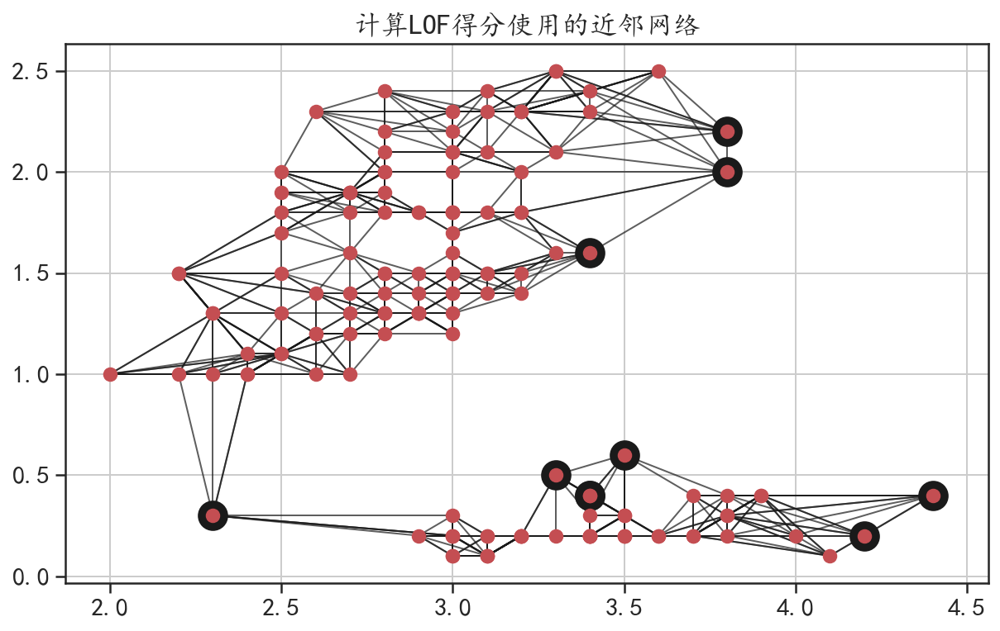

In [34]:
## 因为在计算得分时使用的是近邻的方式计算，所以可以输出数据之间的近邻网络
## 计算近邻网络
kgraph = lof.kneighbors_graph(iris.values).toarray()
## 在二维空间中可视化该网络
## 可视化网络图
plt.figure(figsize=(10,6))
ax = plt.subplot(111)
G = nx.Graph(kgraph)  ## 生成无向图
pos =iris.values       ## 每个节点在空间中的位置
nx.draw_networkx_nodes(G,pos,alpha=1,node_size=60,node_color = "r",ax = ax)
nx.draw_networkx_edges(G,pos,width=1,edge_color= "k",alpha = 0.7)
##  显示坐标系
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
## 计算出异常值的点并可视化在网络上
outlier = iris.values[outlier_pre == -1,:]
plt.scatter(outlier[:,0],outlier[:,1],marker = "o",c = "k",s = 300)
plt.title("计算LOF得分使用的近邻网络")
plt.grid()
plt.show()

## 在图像中异常值，使用了黑色圈进行可视化

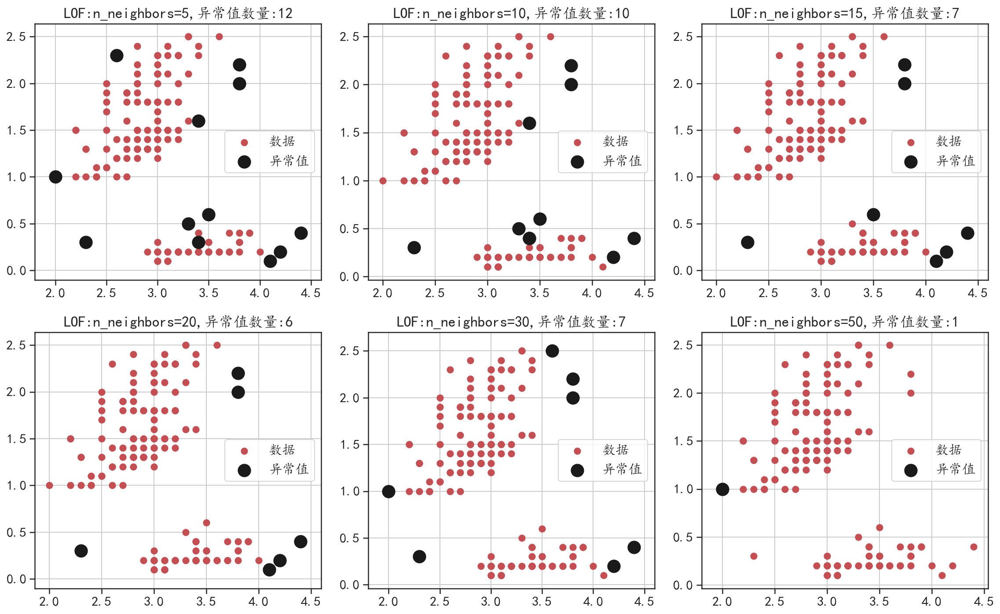

In [35]:
## 使用不同的近邻数量，可以获得不同的异常值数量
nn = [5,10,15,20,30,50]
plt.figure(figsize=(16,10))
for ii,neighbor in enumerate(nn):
    lof = LocalOutlierFactor(n_neighbors = neighbor)
    outlier_pre = lof.fit_predict(iris.values)
    ## 可视化不同n_neighbors取值下的异常值位置
    plt.subplot(2,3,ii+1)
    plt.scatter(iris["SepalWidthCm"], iris["PetalWidthCm"],
                marker = "o",c = "r",s = 50,label = "数据")
    outlier = iris.values[outlier_pre == -1,:]
    plt.scatter(outlier[:,0],outlier[:,1],marker = "o",c = "k",
                s = 200,label = "异常值")
    plt.title("LOF:n_neighbors="+str(neighbor)+",异常值数量:"+str(len(outlier)))
    plt.legend()
    plt.grid()
plt.tight_layout()
plt.show()


In [36]:
## 基于连通性的离群因子（COF）算法
cof = COF(contamination = 0.06,  ## 异常值所占的比例
          n_neighbors = 20,     ## 近邻数量
        )
cof_label = cof.fit_predict(iris.values)
print("检测出的异常值数量为:",np.sum(cof_label == 1))

检测出的异常值数量为: 9


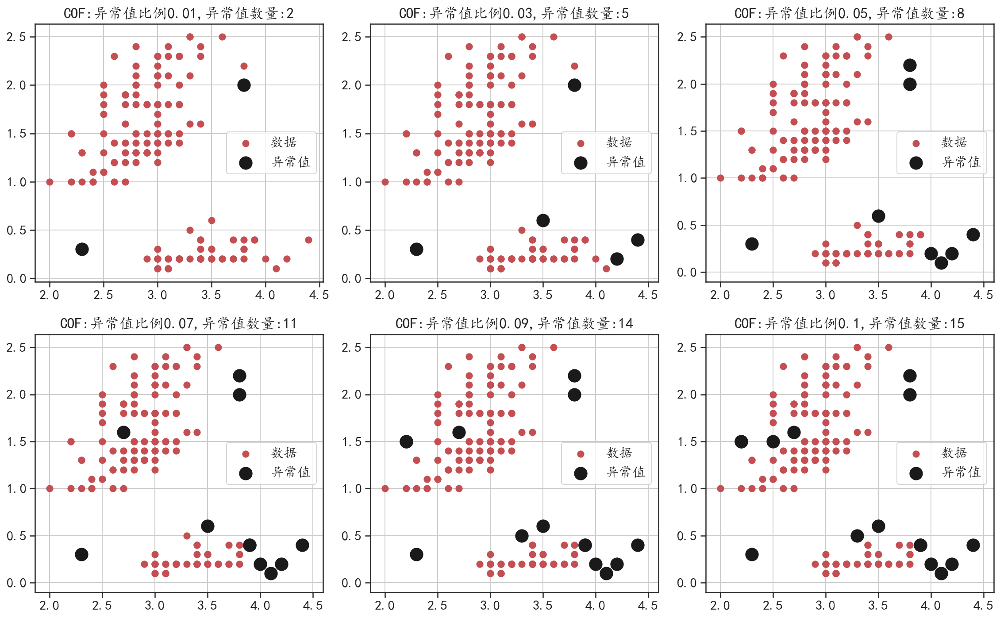

In [37]:
## 可视化数据中随着异常值比例的变化，被确认为是异常值的样本情况
cont = [0.01,0.03,0.05,0.07,0.09,0.1]
plt.figure(figsize=(16,10))
for ii,c in enumerate(cont):
    ## 基于连通性的离群因子算法
    cof = COF(contamination = c,n_neighbors = 30) 
    cof_label = cof.fit_predict(iris.values)
    ## 可视化不同异常值比例下的异常值位置
    plt.subplot(2,3,ii+1)
    plt.scatter(iris["SepalWidthCm"], iris["PetalWidthCm"],
                marker = "o",c = "r",s = 50,label = "数据")
    outlier = iris.values[cof_label == 1,:]
    plt.scatter(outlier[:,0],outlier[:,1],marker = "o",c = "k",
                s = 200,label = "异常值")
    plt.title("COF:异常值比例"+str(c)+",异常值数量:"+str(len(outlier)))
    plt.legend()
    plt.grid()
plt.tight_layout()
plt.show()


#### 7.3.2 带有异常值的高维数据探索


In [3]:
## 读取定义好是否为异常值的数据
outlierdf = pd.read_csv("data/chap7/synthetic.csv")
print(outlierdf.head())

         X0        X1        X2        X3        X4        X5        X6  \
0  0.435518  0.038492  0.551343  0.140049  0.899545  0.588684  0.299706   
1  0.633197  0.034490  0.319406  0.879141  0.163079  0.184356  0.160583   
2  0.421558  0.299824  0.602220  0.521654  0.954621  0.547448  0.882898   
3  0.817491  0.647528  0.046214  0.487270  0.053872  0.817499  0.390589   
4  0.291513  0.474018  0.065267  0.410573  0.903696  0.466520  0.196878   

         X7        X8        X9 outlier  
0  0.245713  0.367375  0.452970      no  
1  0.104973  0.294980  0.429709      no  
2  0.586641  0.840204  0.212529      no  
3  0.394750  0.736854  0.442689     yes  
4  0.165370  0.297764  0.467911      no  


In [4]:
## 查看异常值和非异常值的比例
outlierdf["outlier"].value_counts()

no     900
yes    100
Name: outlier, dtype: int64

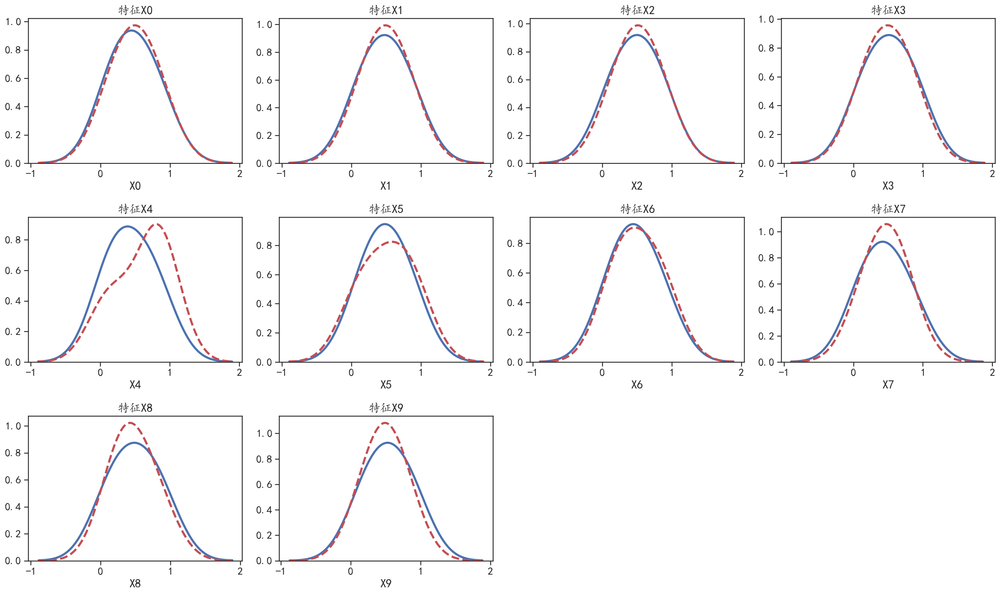

In [5]:
## 可视化是否为异常值时每个特征的分布情况
varname = outlierdf.columns[:-1]
plt.figure(figsize=(20,12))
for ii,name in enumerate(varname):
    plt.subplot(3,4,ii+1)
    plotdata = outlierdf.iloc[:,ii]  ## 对应的特征
    sns.distplot(plotdata[outlierdf.outlier == "yes"],hist=False,
                 kde_kws={"color": "b", "lw": 3,"bw":0.3})
    sns.distplot(plotdata[outlierdf.outlier == "no"],hist=False,
                 kde_kws={"color": "r", "lw": 3,"bw":0.3,"ls":"--"})
    plt.title("特征"+name)
plt.tight_layout()
plt.show()

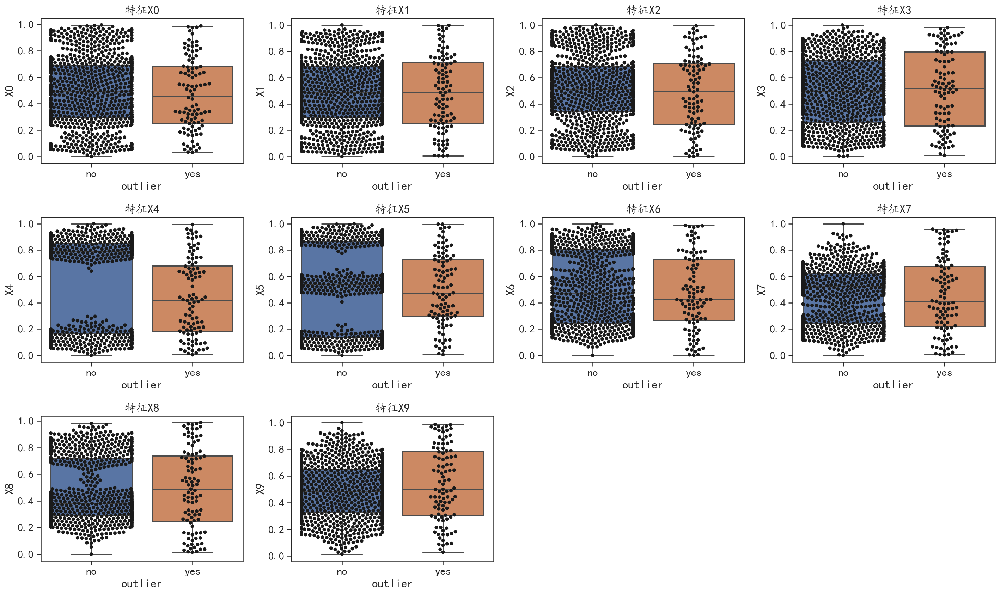

In [6]:
## 使用箱线图可视化是否为异常值时每个特征的分布情况
varname = outlierdf.columns[:-1]
plt.figure(figsize=(20,12))
for ii,name in enumerate(varname):
    plt.subplot(3,4,ii+1)
    plotdata = outlierdf.iloc[:,ii]  ## 对应的特征
    sns.boxplot(x = "outlier", y =name,data = outlierdf)
    sns.swarmplot(x = "outlier", y =name,data = outlierdf,color="k")
    plt.title("特征"+name)
plt.tight_layout()
plt.show()

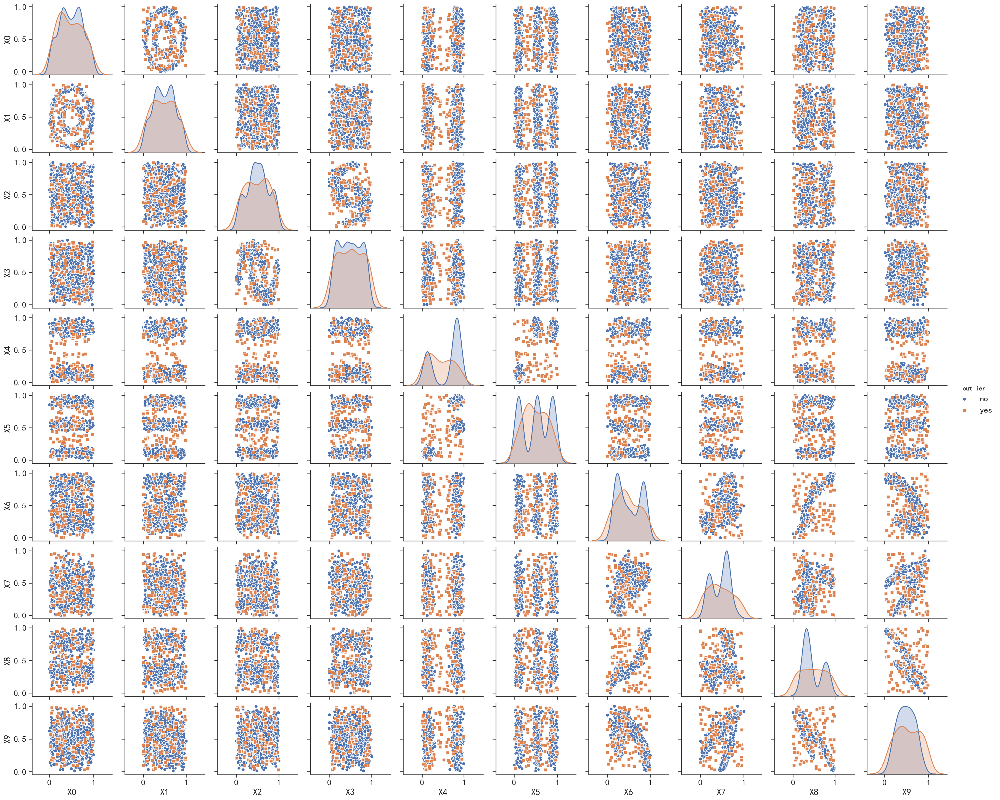

In [7]:
## 使用矩阵散点图对数据进行可视化分析
sns.pairplot(outlierdf,hue="outlier",height=2,aspect=1.2,
             diag_kind="kde",markers=["o", "s"])
plt.show()

## 可以发现使用数据中的某两个变量都很难的对数据进行异常值区分

(1000, 2)


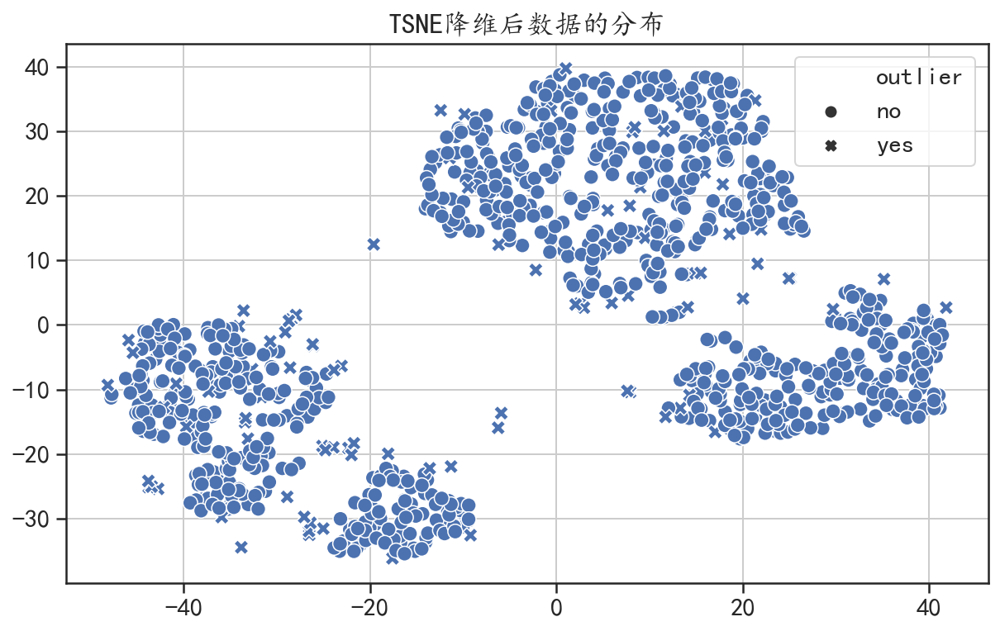

In [8]:
## 使用TSNE降维可视化数据的分布
## TSNE进行数据的降维,降维到2维空间中
tsne = TSNE(n_components = 2,perplexity =30,
            early_exaggeration =3,random_state=123) 

## 获取降维后的数据
tsne_outlier = tsne.fit_transform(outlierdf.iloc[:,0:10].values)
print(tsne_outlier .shape)
## 可视化在二维空间中的分布
plt.figure(figsize=(10,6))
sns.scatterplot(x=tsne_outlier[:,0], y=tsne_outlier[:,1],
                style = outlierdf.outlier,s = 80)
plt.legend(loc = 1)
plt.grid()
plt.title("TSNE降维后数据的分布")
plt.show()

## 可以发现降维可视化后，也是很难把异常值快速的区分

In [9]:
## 对是否为异常值进行重新编码
X = outlierdf.iloc[:,0:10].values
Y = np.where(outlierdf.outlier == "yes",1,0)
## 将数据切分为训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size=0.3,random_state=2)
print("训练数据:",X_train.shape)
print("训练数据中异常值数量:",np.unique(y_train,return_counts = True))
print("测试数据:",X_test.shape)
print("测试数据中异常值数量:",np.unique(y_test,return_counts = True))

## 训练数据中，异常值有71个，测试数据中异常值有29个

训练数据: (700, 10)
训练数据中异常值数量: (array([0, 1]), array([629,  71]))
测试数据: (300, 10)
测试数据中异常值数量: (array([0, 1]), array([271,  29]))


#### 7.3.3 基于PCA和SOD的异常值检测方法
 

In [45]:
## 使用基于PCA方法的异常值识别
pcaod = PCA(n_components = "mle",  #自动猜测保留的主成分数量
            n_selected_components = 4, # 计算异常值得分时使用的主成分数量
            contamination = 0.1,    # 异常值所占比例
            random_state = 123)
pcaod.fit(X_train)   ## 对训练数据进行拟合
pcaod_lab = pcaod.labels_
print("在训练集上是否为异常值判断正确的精度为:\n",classification_report(y_train,pcaod_lab))

在训练集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.92      0.93      0.92       629
           1       0.33      0.32      0.33        71

    accuracy                           0.86       700
   macro avg       0.63      0.62      0.63       700
weighted avg       0.86      0.86      0.86       700



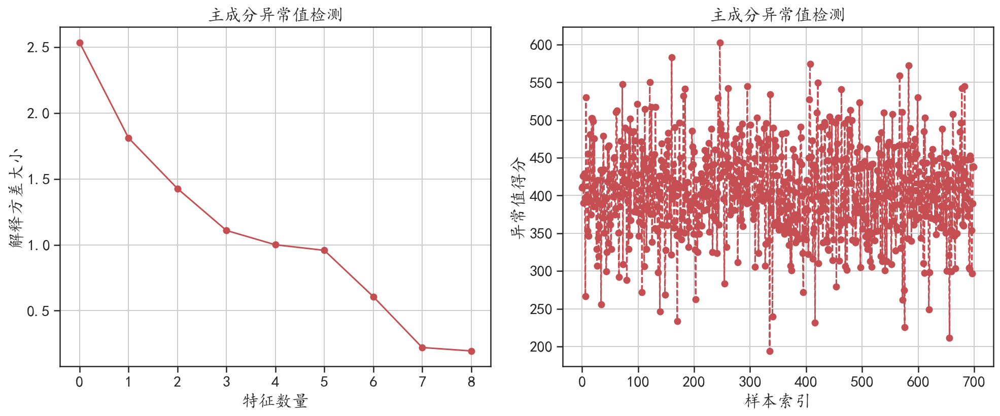

In [46]:
## 可视化解释方差的取值情况和样本的异常值得分
expvar = pcaod.explained_variance_ ## 主成分的解释方差
descore = pcaod.decision_scores_  ## 样本的异常值得分
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.plot(expvar,"r-o")
plt.grid()
plt.xlabel("特征数量")
plt.ylabel("解释方差大小")
plt.title("主成分异常值检测")
plt.subplot(1,2,2)
plt.plot(descore,"r--o")
plt.grid()
plt.xlabel("样本索引")
plt.ylabel("异常值得分")
plt.title("主成分异常值检测")
plt.tight_layout()
plt.show()
## 从图像中可以发现，自动保留了数据的9个主成分

In [47]:
## 对测试集进行预测，并计算预测的精度
pcaod_pre = pcaod.predict(X_test)
print("在测试集上是否为异常值判断正确的精度为:\n",classification_report(y_test,pcaod_pre))

在测试集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.93      0.87      0.90       271
           1       0.22      0.34      0.27        29

    accuracy                           0.82       300
   macro avg       0.57      0.61      0.58       300
weighted avg       0.86      0.82      0.84       300



#### SOD是一种子空间异常值检测方法

目的在于检测高维特征空间的变化子空间中的离群值。

In [10]:
sod = SOD(n_neighbors = 20,  ## 使用K近邻查询是的近邻数量
          ref_set = 10, ## 创建参考集的共享最近邻居的数量
          alpha = 0.85, ## 选择指定子空间的下限
          contamination  = 0.1)
sod.fit(X_train)
sod_lab = sod.labels_
print("在训练集上是否为异常值判断正确的精度为:\n",classification_report(y_train,sod_lab))

在训练集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       629
           1       0.84      0.83      0.84        71

    accuracy                           0.97       700
   macro avg       0.91      0.91      0.91       700
weighted avg       0.97      0.97      0.97       700



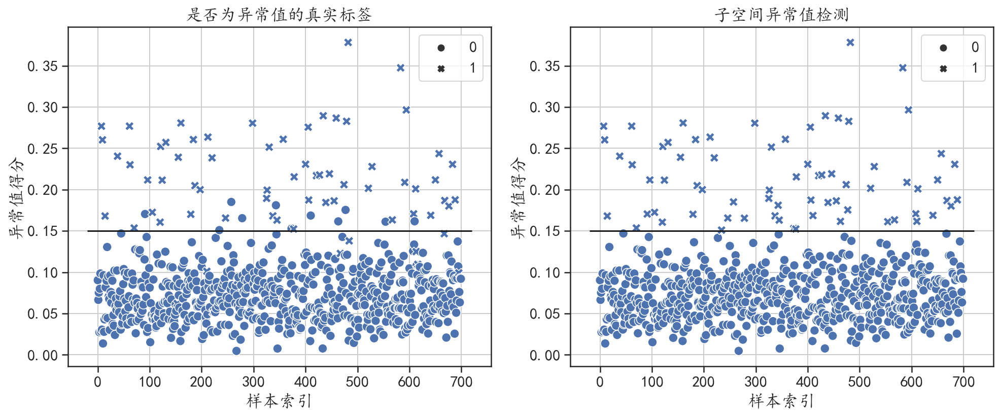

In [11]:
## 输出模型对每个样本的异常值得分
descore = sod.decision_scores_  ## 样本的异常值得分
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.scatterplot(x = range(len(descore)), y=descore,
                style = y_train,s = 80)
plt.grid()
plt.xlabel("样本索引")
plt.ylabel("异常值得分")
plt.title("是否为异常值的真实标签")
plt.hlines(0.15,xmin=-20,xmax=720,colors = "k")

plt.subplot(1,2,2)
sns.scatterplot(x = range(len(descore)), y=descore,
                style = sod_lab,s = 80)
plt.hlines(0.15,xmin=-20,xmax=720,colors = "k")
plt.grid()
plt.xlabel("样本索引")
plt.ylabel("异常值得分")
plt.title("子空间异常值检测")
plt.tight_layout()
plt.show()

## 可以发现在真实标签的数据可视化中，大部分的异常值标签的异常值得分大于0.15，只是少量的非异常值的异常值得分大于0.15
## 所以在判断是否为异常值时，学习到的模型，根据其得分是否大于0.15作出来判断，此时的算法的精度较高

In [12]:
## 对测试集进行预测,并计算预测精度
sod_pre = sod.predict(X_test)
print("在测试集上是否为异常值判断正确的精度为:\n",classification_report(y_test,sod_pre))

在测试集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.98      0.95      0.96       271
           1       0.62      0.79      0.70        29

    accuracy                           0.93       300
   macro avg       0.80      0.87      0.83       300
weighted avg       0.94      0.93      0.94       300



In [14]:
sod.threshold_

0.14732582969965013

####  7.3.4 孤立森林异常值检测


In [51]:
## 建立孤立森林异常值检测模型
ifod = IForest(n_estimators = 100,  #基础估计器的数量
               contamination = 0.1,
               max_features = 10, # 每个估计器最多可使用全部的特征
               random_state = 12 )
ifod.fit(X_train)
ifod_lab = ifod.labels_
print("在训练集上是否为异常值判断正确的精度为:\n",classification_report(y_train,ifod_lab))

在训练集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96       629
           1       0.61      0.61      0.61        71

    accuracy                           0.92       700
   macro avg       0.78      0.78      0.78       700
weighted avg       0.92      0.92      0.92       700



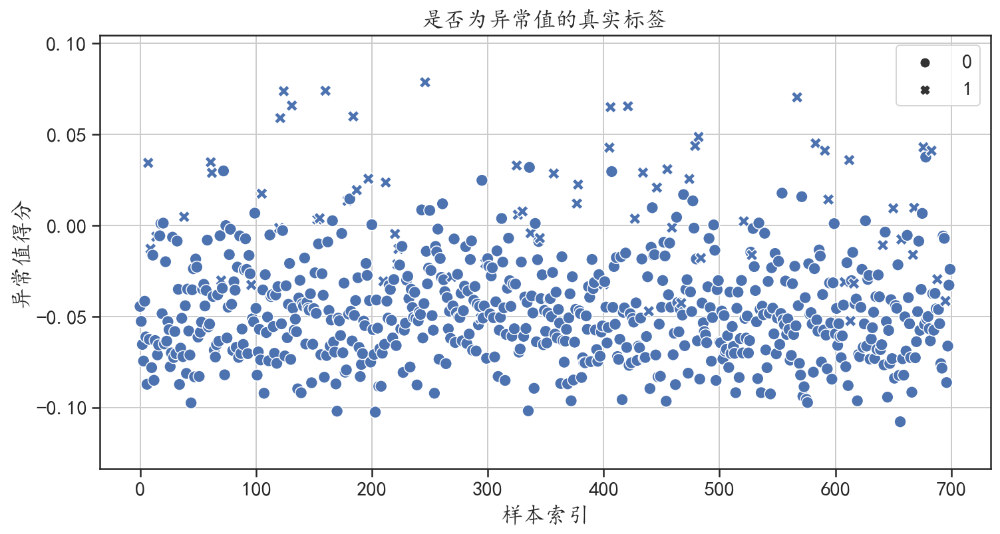

In [52]:
## 输出模型对每个样本的异常值得分
descore = ifod.decision_scores_  ## 样本的异常值得分
plt.figure(figsize=(12,6))
sns.scatterplot(x = range(len(descore)), y=descore,
                style = y_train,s = 80)
plt.grid()
plt.xlabel("样本索引")
plt.ylabel("异常值得分")
plt.title("是否为异常值的真实标签")
plt.show()

In [53]:
## 对测试集进行预测,并计算预测精度
ifod_pre = ifod.predict(X_test)
print("在测试集上是否为异常值判断正确的精度为:\n",classification_report(y_test,ifod_pre))

## 异常值的识别正确率为46%左右

在测试集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94       271
           1       0.46      0.66      0.54        29

    accuracy                           0.89       300
   macro avg       0.71      0.79      0.74       300
weighted avg       0.91      0.89      0.90       300



#### 7.3.5 支持向量机异常值检测


In [54]:
## sklearn库的支持向量机检测异常值的方法使用
osvm = OneClassSVM(kernel="linear",  #使用线性核
                   nu = 0.005)
osvm.fit(X_train)
osvm_lab = osvm.predict(X_train) # 预测结果中-1代表离群值
osvm_lab = np.where(osvm_lab== -1,1,0)
print("在训练集上是否为异常值判断正确的精度为:\n",classification_report(y_train,osvm_lab))
## 对测试集进行预测,并计算预测精度
osvm_pre = osvm.predict(X_test)
osvm_pre = np.where(osvm_pre== -1,1,0)
print("在测试集上是否为异常值判断正确的精度为:\n",classification_report(y_test,osvm_pre))

## 可以发现使用线性核在训练集上的异常值预测精度为0.2，而在测试集上异常值的预测精度为0


在训练集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.90      0.99      0.94       629
           1       0.20      0.01      0.03        71

    accuracy                           0.89       700
   macro avg       0.55      0.50      0.49       700
weighted avg       0.83      0.89      0.85       700

在测试集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.90      1.00      0.95       271
           1       0.00      0.00      0.00        29

    accuracy                           0.90       300
   macro avg       0.45      0.50      0.47       300
weighted avg       0.82      0.90      0.86       300



In [55]:
## 使用参数网格搜索找到效果最好的一组参数

recall = []
precision = []
f1 = []
## 定义网格搜索的参数
kernel = ["linear", "poly", "rbf", "sigmoid"]
degrees = [2,3]
gammas=[0.005,0.05,0.5,5]
coef0 = [0.005,0.05,0.5,1]
nu = [0.005,0.05,0.1,0.5]

para_grid = {"kernel":kernel,"gamma": gammas,"degree":degrees,
             "coef0":coef0,"nu":nu}
## 生成网格数据
k,d,g,c,n = np.meshgrid(kernel,degrees,gammas,coef0,nu)
## 生成数据表
paradf = pd.DataFrame(data = {"kernel":k.flatten(),"degrees":d.flatten(),
                              "gammas":g.flatten(),"coef0":c.flatten(),
                              "nu":n.flatten()})
## 是由for循环计算在测试集上异常值的预测精度
for ii in paradf.index:
    ## 定义模型
    osvm = OneClassSVM(kernel=paradf.kernel[ii],degree=paradf.degrees[ii],
                       gamma=paradf.gammas[ii],coef0=paradf.coef0[ii],
                       nu=paradf.nu[ii],tol = 1e-6)
    osvm.fit(X_train)
    osvm_pre = osvm.predict(X_test)
    osvm_pre = np.where(osvm_pre== -1,1,0)
    ## 计算在测试集上的recall和precision
    outlier_recall = recall_score(y_test,osvm_pre)
    outlier_precision = precision_score(y_test,osvm_pre)
    outlier_f1 = f1_score(y_test,osvm_pre)
    recall.append(outlier_recall)
    precision.append(outlier_precision)
    f1.append(outlier_f1)

In [56]:
## 输出教过较好的结果
paradf["recall"] = recall
paradf["precision"] =  precision
paradf["f1"] =  f1
print(paradf.sort_values("f1",ascending=False).head(8))

## 针对这些precision较高的参数，此时有更多的样本识别为了异常值，所以

    kernel  degrees  gammas  coef0     nu    recall  precision        f1
436    rbf        3     5.0   0.05  0.005  0.965517    0.20438  0.337349
184    rbf        2     5.0   0.50  0.005  0.965517    0.20438  0.337349
440    rbf        3     5.0   0.50  0.005  0.965517    0.20438  0.337349
441    rbf        3     5.0   0.50  0.050  0.965517    0.20438  0.337349
442    rbf        3     5.0   0.50  0.100  0.965517    0.20438  0.337349
444    rbf        3     5.0   1.00  0.005  0.965517    0.20438  0.337349
445    rbf        3     5.0   1.00  0.050  0.965517    0.20438  0.337349
446    rbf        3     5.0   1.00  0.100  0.965517    0.20438  0.337349


In [57]:
## 改变SVM异常值识别时使用的核函数
osvm = OneClassSVM(kernel="rbf",  #使用线性核
                   degree = 3,gamma = 5,coef0 = 0.05,
                   nu = 0.005,tol = 1e-6)
osvm.fit(X_train)
osvm_lab = osvm.predict(X_train) # 预测结果中-1代表离群值
osvm_lab = np.where(osvm_lab== -1,1,0)
print("在训练集上是否为异常值判断正确的精度为:\n",classification_report(y_train,osvm_lab))
## 对测试集进行预测,并计算预测精度
osvm_pre = osvm.predict(X_test)
osvm_pre = np.where(osvm_pre== -1,1,0)
print("在测试集上是否为异常值判断正确的精度为:\n",classification_report(y_test,osvm_pre))
print("预测结果中非异常值和异常值的数量分别为:",np.unique(osvm_pre,return_counts = True))

## 可以发现使用rbf核在训练集上的所有的异常值预测准确率为0.79，而在测试集上所有的异常值的预测准确率为0.63



在训练集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.94      0.81      0.87       629
           1       0.25      0.56      0.35        71

    accuracy                           0.79       700
   macro avg       0.60      0.69      0.61       700
weighted avg       0.87      0.79      0.82       700

在测试集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.99      0.60      0.75       271
           1       0.20      0.97      0.34        29

    accuracy                           0.63       300
   macro avg       0.60      0.78      0.54       300
weighted avg       0.92      0.63      0.71       300

预测结果中非异常值和异常值的数量分别为: (array([0, 1]), array([163, 137]))


|方法|recall|f1-score|accuracy|
|:----:|:----:|:----:|:----:|
|PCA|0.32|0.33|0.86|
|SOD|0.79|0.70|0.93|
|IForest|0.66|0.54|0.89|
|OneClassSVM|0.97|0.34|0.63|

**效果最好的方法是SOD**

#### 7.3.6 XGOB

通过无监督表示学习改进有监督的异常值检测。 半监督离群值检测框架。

In [58]:
xgod = XGBOD(n_estimators =100, ## 树的数量
             max_depth = 10,    # 最大深度
             learning_rate = 0.1, # 学习率 
             reg_alpha = 0.01, # L1范数约束的权重
             random_state = 12)
## 注意在拟合该模型时，使用了是否为异常值的标签进了监督
xgod.fit(X_train,y_train)  
xgod_lab = xgod.labels_
print("在训练集上是否为异常值判断正确的精度为:\n",classification_report(y_train,xgod_lab))

[10:50:49] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


在训练集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       629
           1       1.00      1.00      1.00        71

    accuracy                           1.00       700
   macro avg       1.00      1.00      1.00       700
weighted avg       1.00      1.00      1.00       700



In [59]:
## 对测试集进行预测,并计算预测精度
xgod_pre = xgod.predict(X_test)
print("在测试集上是否为异常值判断正确的精度为:\n",classification_report(y_test,xgod_pre))
print("预测结果中非异常值和异常值的数量分别为:",np.unique(xgod_pre,return_counts = True))

## 异常值的识别正确率为90%左右，这是因为在训练是否为异常值的模型时，使用了类别标签作为了监督
## 所以这类方法适用于已经知道训练数据集上哪些样本是异常值的数据

在测试集上是否为异常值判断正确的精度为:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       271
           1       0.90      0.93      0.92        29

    accuracy                           0.98       300
   macro avg       0.95      0.96      0.95       300
weighted avg       0.98      0.98      0.98       300

预测结果中非异常值和异常值的数量分别为: (array([0, 1]), array([270,  30]))
